In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import glob
import zipfile
import random
import math
import copy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF



from tqdm.auto import tqdm

In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [ ]:
gopro_zip_path      = "/content/drive/MyDrive/PixelClear/zips/GOPRO_Large.zip"
local_extract_root  = "/content/datasets/"
gopro_local_dir     = "/content/datasets/"

print("GoPro zip path      :", gopro_zip_path)
print("Local extract folder:", gopro_local_dir)

GoPro zip path      : /content/drive/MyDrive/PixelClear/zips/GOPRO_Large.zip
Local extract folder: /content/datasets/


In [ ]:
expected_train = os.path.join(gopro_local_dir, "train")
expected_test  = os.path.join(gopro_local_dir, "test")

os.makedirs(local_extract_root, exist_ok=True)

if not os.path.exists(gopro_zip_path):
    raise FileNotFoundError(f"Zip file not found: {gopro_zip_path}")

if os.path.exists(expected_train) and os.path.exists(expected_test):
    print("GoPro dataset already properly extracted.")
else:
    print("Extracting GoPro dataset...")
    with zipfile.ZipFile(gopro_zip_path, "r") as zip_ref:
        zip_ref.extractall(local_extract_root)
    print("Extraction completed.")

Extracting GoPro dataset...
Extraction completed.


In [ ]:
def show_folder_tree(root_path, max_depth=2):
    root_path = os.path.abspath(root_path)
    for root, dirs, files in os.walk(root_path):
        level = root.replace(root_path, "").count(os.sep)
        if level > max_depth:
            continue
        indent = " " * 4 * level
        print(f"{indent}{os.path.basename(root)}/")
        subindent = " " * 4 * (level + 1)
        for f in files[:5]:
            print(f"{subindent}{f}")

show_folder_tree(gopro_local_dir, max_depth=2)

datasets/
    train/
        GOPR0380_11_00/
            frames 11 offset 0.txt
        GOPR0477_11_00/
            frames 11 offset 0.txt
        GOPR0868_11_02/
        GOPR0386_11_00/
            frames 11 offset 0.txt
        GOPR0384_11_01/
        GOPR0378_13_00/
            frames 13 offset 22000.txt
        GOPR0384_11_03/
        GOPR0881_11_00/
        GOPR0374_11_02/
            frames 11 offset 0.txt
        GOPR0379_11_00/
            frames 11 offset 0.txt
        GOPR0374_11_01/
            frames 11 offset 0.txt
        GOPR0857_11_00/
            frames 11 offset 0.txt
        GOPR0385_11_00/
        GOPR0884_11_00/
            frames 11 offset 0.txt
        GOPR0384_11_02/
        GOPR0384_11_04/
        GOPR0374_11_00/
            frames 11 offset 0.txt
        GOPR0868_11_01/
            frames 11 offset 0.txt
        GOPR0372_07_01/
            frames 7 offset 0.txt
        GOPR0871_11_01/
            frames 11 offset 0.txt
        GOPR0374_11_03/
            frame

In [ ]:
def build_gopro_pair_list(split_name):
    pairs = []
    blur_folders = sorted(
        glob.glob(os.path.join(gopro_local_dir, split_name, "**", "blur"), recursive=True)
    )
    for blur_folder in blur_folders:
        sharp_folder = blur_folder.replace("/blur", "/sharp")
        if not os.path.exists(sharp_folder):
            continue
        blur_images = sorted(glob.glob(os.path.join(blur_folder, "*.png")))
        for blur_img in blur_images:
            sharp_img = os.path.join(sharp_folder, os.path.basename(blur_img))
            if os.path.exists(sharp_img):
                pairs.append({"input": blur_img, "target": sharp_img})
    return pairs

gopro_train_pairs = build_gopro_pair_list("train")
gopro_test_pairs  = build_gopro_pair_list("test")

print("GoPro train pairs:", len(gopro_train_pairs))
print("GoPro test pairs :", len(gopro_test_pairs))

if len(gopro_train_pairs) > 0:
    print("Example train pair:", gopro_train_pairs[0])

GoPro train pairs: 2103
GoPro test pairs : 1111
Example train pair: {'input': '/content/datasets/train/GOPR0372_07_00/blur/000047.png', 'target': '/content/datasets/train/GOPR0372_07_00/sharp/000047.png'}


In [ ]:
def validate_pair_list(pairs, name="dataset"):
    valid_pairs = []
    missing_inputs  = 0
    missing_targets = 0
    for pair in pairs:
        input_ok  = os.path.exists(pair["input"])
        target_ok = os.path.exists(pair["target"])
        if input_ok and target_ok:
            valid_pairs.append(pair)
        else:
            if not input_ok:  missing_inputs  += 1
            if not target_ok: missing_targets += 1

    print(f"Pair-list validation summary — {name}")
    print("Total pairs loaded  :", len(pairs))
    print("Valid pairs         :", len(valid_pairs))
    print("Skipped pairs       :", len(pairs) - len(valid_pairs))
    print("Missing input files :", missing_inputs)
    print("Missing target files:", missing_targets)
    return valid_pairs

gopro_train_pairs = validate_pair_list(gopro_train_pairs, "GoPro Train")
gopro_test_pairs  = validate_pair_list(gopro_test_pairs,  "GoPro Test")

Pair-list validation summary — GoPro Train
Total pairs loaded  : 2103
Valid pairs         : 2103
Skipped pairs       : 0
Missing input files : 0
Missing target files: 0
Pair-list validation summary — GoPro Test
Total pairs loaded  : 1111
Valid pairs         : 1111
Skipped pairs       : 0
Missing input files : 0
Missing target files: 0


In [ ]:
def load_rgb_image(path):
    return Image.open(path).convert("RGB")

In [ ]:
def paired_random_crop(img1, img2, crop_size=320):
    w, h = img1.size
    if w != img2.size[0] or h != img2.size[1]:
        raise ValueError("Input and target image sizes do not match.")
    if w < crop_size or h < crop_size:
        new_w = max(w, crop_size)
        new_h = max(h, crop_size)
        img1 = img1.resize((new_w, new_h), Image.BICUBIC)
        img2 = img2.resize((new_w, new_h), Image.BICUBIC)
        w, h = img1.size
    x = random.randint(0, w - crop_size)
    y = random.randint(0, h - crop_size)
    img1 = img1.crop((x, y, x + crop_size, y + crop_size))
    img2 = img2.crop((x, y, x + crop_size, y + crop_size))
    return img1, img2

In [ ]:
def paired_augment(img1, img2):
    # Horizontal flip
    if random.random() < 0.5:
        img1 = TF.hflip(img1)
        img2 = TF.hflip(img2)

    # Vertical flip
    if random.random() < 0.5:
        img1 = TF.vflip(img1)
        img2 = TF.vflip(img2)

    # 90-degree rotation
    angle = random.choice([0, 90, 180, 270])
    img1 = TF.rotate(img1, angle)
    img2 = TF.rotate(img2, angle)

    if random.random() < 0.4:
        factor = random.uniform(0.8, 1.2)
        img1 = TF.adjust_brightness(img1, factor)
        img2 = TF.adjust_brightness(img2, factor)

    if random.random() < 0.3:
        factor = random.uniform(0.85, 1.15)
        img1 = TF.adjust_contrast(img1, factor)
        img2 = TF.adjust_contrast(img2, factor)

    return img1, img2

In [ ]:
class GoProDataset(Dataset):
    def __init__(self, pairs, crop_size=320, training=True):
        self.pairs     = pairs
        self.crop_size = crop_size
        self.training  = training

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        pair = self.pairs[idx]
        input_img  = load_rgb_image(pair["input"])
        target_img = load_rgb_image(pair["target"])

        if self.training:
            input_img, target_img = paired_random_crop(input_img, target_img, self.crop_size)
            input_img, target_img = paired_augment(input_img, target_img)
        else:
            w, h = input_img.size
            crop = min(self.crop_size, w, h)
            left = (w - crop) // 2
            top  = (h - crop) // 2
            input_img  = input_img.crop((left, top, left + crop, top + crop))
            target_img = target_img.crop((left, top, left + crop, top + crop))

        input_tensor  = TF.to_tensor(input_img)
        target_tensor = TF.to_tensor(target_img)
        return input_tensor, target_tensor

In [ ]:
CROP_SIZE    = 320
BATCH_SIZE   = 8
NUM_WORKERS  = 0
EPOCHS       = 100
LR           = 2e-4
WEIGHT_DECAY = 1e-4

In [ ]:
train_dataset = GoProDataset(pairs=gopro_train_pairs, crop_size=CROP_SIZE, training=True)
test_dataset  = GoProDataset(pairs=gopro_test_pairs,  crop_size=CROP_SIZE, training=False)

print("Train dataset size:", len(train_dataset))
print("Test dataset size :", len(test_dataset))

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available()
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available()
)

print("Train loader batches:", len(train_loader))
print("Test loader batches :", len(test_loader))

Train dataset size: 2103
Test dataset size : 1111
Train loader batches: 263
Test loader batches : 139


In [ ]:
batch_inputs, batch_targets = next(iter(train_loader))

print("Batch input shape :", batch_inputs.shape)
print("Batch target shape:", batch_targets.shape)
print("Input dtype       :", batch_inputs.dtype)
print("Input min/max     :", batch_inputs.min().item(), batch_inputs.max().item())

Batch input shape : torch.Size([8, 3, 320, 320])
Batch target shape: torch.Size([8, 3, 320, 320])
Input dtype       : torch.float32
Input min/max     : 0.0 1.0


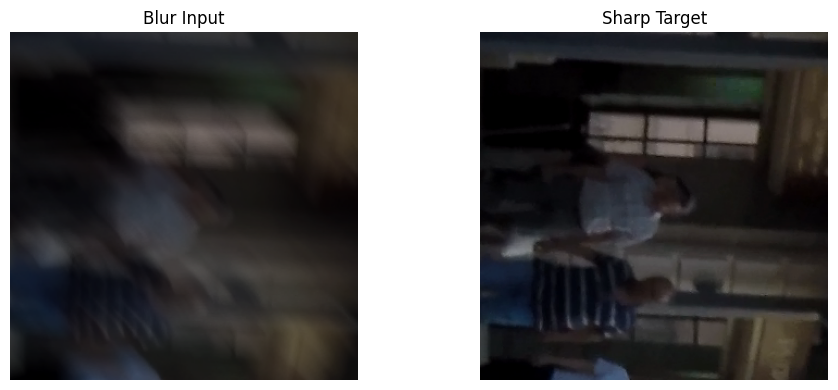

In [ ]:
def tensor_to_image(tensor):
    img = tensor.detach().cpu().permute(1, 2, 0).numpy()
    return np.clip(img, 0, 1)

sample_input  = batch_inputs[0]
sample_target = batch_targets[0]

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(tensor_to_image(sample_input));  axes[0].set_title("Blur Input");   axes[0].axis("off")
axes[1].imshow(tensor_to_image(sample_target)); axes[1].set_title("Sharp Target"); axes[1].axis("off")
plt.tight_layout(); plt.show()

## Preprocessing Visualizations

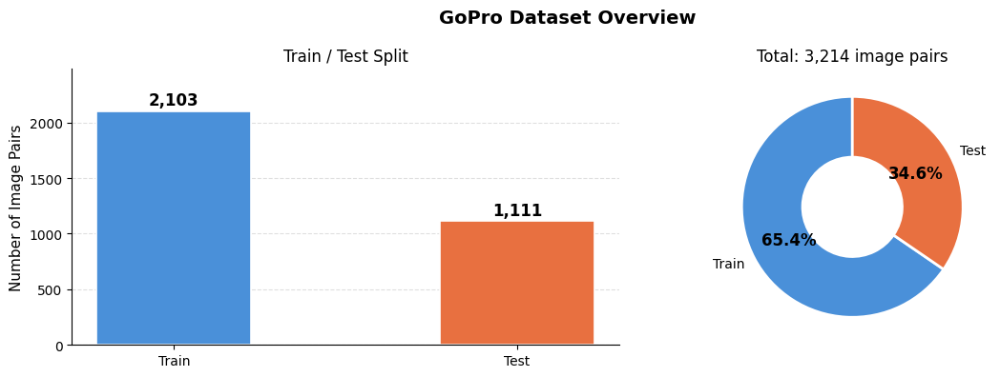

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle("GoPro Dataset Overview", fontsize=14, fontweight="bold")

split_names  = ["Train", "Test"]
split_counts = [len(gopro_train_pairs), len(gopro_test_pairs)]
bar_colors   = ["#4A90D9", "#E87040"]

ax = axes[0]
bars = ax.bar(split_names, split_counts, color=bar_colors, width=0.45,
              edgecolor="white", linewidth=1.2)
for bar, val in zip(bars, split_counts):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 20,
            f"{val:,}", ha="center", va="bottom", fontsize=12, fontweight="bold")
ax.set_ylabel("Number of Image Pairs", fontsize=11)
ax.set_title("Train / Test Split", fontsize=12)
ax.set_ylim(0, max(split_counts) * 1.18)
ax.spines[["top", "right"]].set_visible(False)
ax.yaxis.grid(True, linestyle="--", alpha=0.4)
ax.set_axisbelow(True)

ax2 = axes[1]
wedges, texts, autotexts = ax2.pie(
    split_counts, labels=split_names, colors=bar_colors,
    autopct="%1.1f%%", startangle=90, pctdistance=0.65,
    wedgeprops=dict(width=0.55, edgecolor="white", linewidth=2)
)
for at in autotexts:
    at.set_fontsize(12); at.set_fontweight("bold")
ax2.set_title(f"Total: {sum(split_counts):,} image pairs", fontsize=12)

plt.tight_layout()
plt.show()


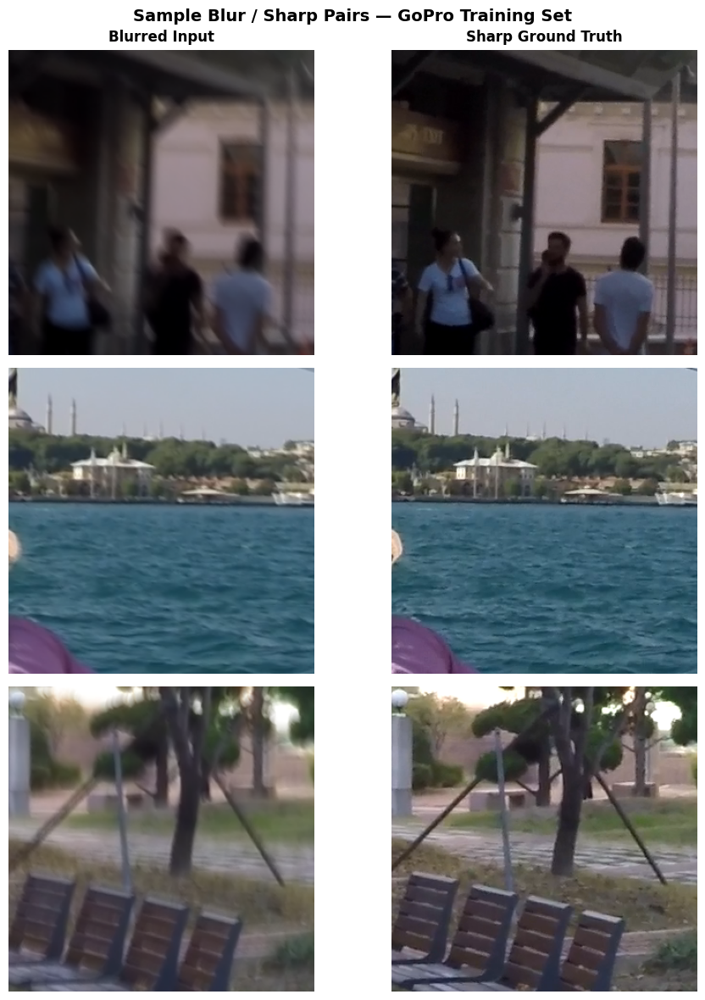

In [ ]:
from PIL import Image as _PIL
import random as _rnd

_rnd.seed(7)
_sample_idx = _rnd.sample(range(len(gopro_train_pairs)), 3)

fig, axes = plt.subplots(3, 2, figsize=(10, 12))
fig.suptitle("Sample Blur / Sharp Pairs — GoPro Training Set",
             fontsize=14, fontweight="bold")
axes[0][0].set_title("Blurred Input",      fontsize=12, fontweight="bold", pad=8)
axes[0][1].set_title("Sharp Ground Truth", fontsize=12, fontweight="bold", pad=8)

for row, idx in enumerate(_sample_idx):
    pair      = gopro_train_pairs[idx]
    _blur_im  = _PIL.open(pair["input"]).convert("RGB")
    _sharp_im = _PIL.open(pair["target"]).convert("RGB")
    _w, _h = _blur_im.size
    _l = (_w - 320) // 2; _t = (_h - 320) // 2
    _bc = _blur_im.crop( (_l, _t, _l + 320, _t + 320))
    _sc = _sharp_im.crop((_l, _t, _l + 320, _t + 320))
    axes[row][0].imshow(_bc);  axes[row][0].axis("off")
    axes[row][1].imshow(_sc);  axes[row][1].axis("off")
    axes[row][0].set_ylabel(f"Pair {row + 1}", fontsize=10,
                             rotation=0, labelpad=52, va="center")

plt.tight_layout()
plt.show()


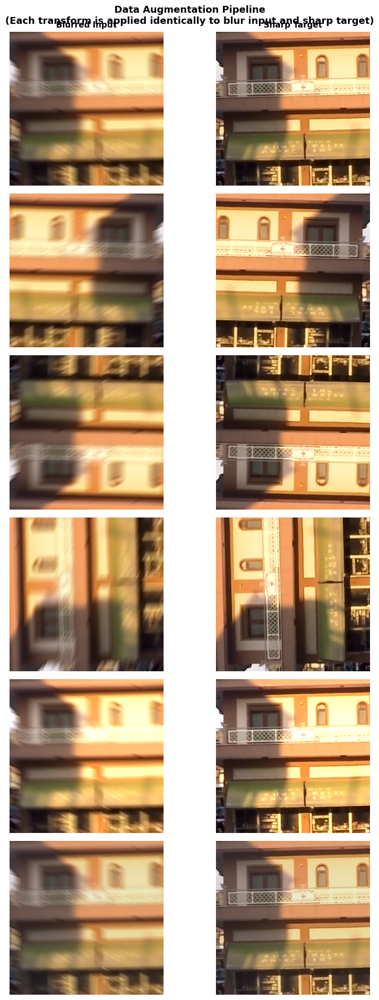

In [ ]:
import torchvision.transforms.functional as _TF2
from PIL import Image as _PIL2

_base_blur  = _PIL2.open(gopro_train_pairs[0]["input"]).convert("RGB")
_base_sharp = _PIL2.open(gopro_train_pairs[0]["target"]).convert("RGB")
_w, _h = _base_blur.size
_l = (_w - 320) // 2; _t = (_h - 320) // 2
_base_blur  = _base_blur.crop( (_l, _t, _l + 320, _t + 320))
_base_sharp = _base_sharp.crop((_l, _t, _l + 320, _t + 320))

_aug_configs = [
    ("Original crop 320x320",    _base_blur,                                _base_sharp),
    ("Horizontal flip (p=0.5)",  _TF2.hflip(_base_blur),                    _TF2.hflip(_base_sharp)),
    ("Vertical flip (p=0.5)",    _TF2.vflip(_base_blur),                    _TF2.vflip(_base_sharp)),
    ("90-degree rotation",       _TF2.rotate(_base_blur, 90),               _TF2.rotate(_base_sharp, 90)),
    ("Brightness x 1.2",         _TF2.adjust_brightness(_base_blur, 1.2),   _TF2.adjust_brightness(_base_sharp, 1.2)),
    ("Contrast x 0.85",          _TF2.adjust_contrast(_base_blur, 0.85),    _TF2.adjust_contrast(_base_sharp, 0.85)),
]

fig, axes = plt.subplots(len(_aug_configs), 2, figsize=(9, 3.2 * len(_aug_configs)))
fig.suptitle("Data Augmentation Pipeline\n"
             "(Each transform is applied identically to blur input and sharp target)",
             fontsize=13, fontweight="bold")

for row, (label, aug_b, aug_s) in enumerate(_aug_configs):
    axes[row][0].imshow(aug_b); axes[row][0].axis("off")
    axes[row][1].imshow(aug_s); axes[row][1].axis("off")
    axes[row][0].set_ylabel(label, fontsize=9, rotation=0, labelpad=90, va="center")
    if row == 0:
        axes[row][0].set_title("Blurred Input", fontsize=11, fontweight="bold")
        axes[row][1].set_title("Sharp Target",  fontsize=11, fontweight="bold")

plt.tight_layout()
plt.show()


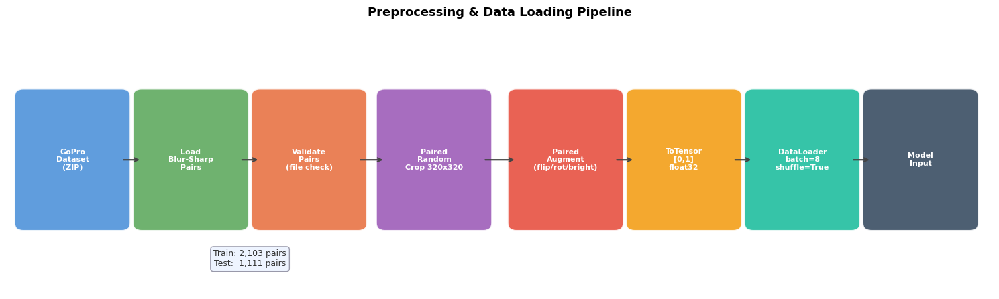

In [ ]:
fig, ax = plt.subplots(figsize=(15, 4.5))
ax.set_xlim(0, 15); ax.set_ylim(0, 4.5); ax.axis("off")
fig.suptitle("Preprocessing & Data Loading Pipeline",
             fontsize=13, fontweight="bold")

_steps = [
    ("GoPro\nDataset\n(ZIP)",               1.0,  "#4A90D9"),
    ("Load\nBlur-Sharp\nPairs",             2.8,  "#5BA85B"),
    ("Validate\nPairs\n(file check)",       4.6,  "#E87040"),
    ("Paired\nRandom\nCrop 320x320",        6.5,  "#9B59B6"),
    ("Paired\nAugment\n(flip/rot/bright)",  8.5,  "#E74C3C"),
    ("ToTensor\n[0,1]\nfloat32",           10.3,  "#F39C12"),
    ("DataLoader\nbatch=8\nshuffle=True",   12.1,  "#1ABC9C"),
    ("Model\nInput",                        13.9,  "#34495E"),
]

_bw = 1.5; _bh = 2.2; _ym = 2.3
for _label, _xc, _color in _steps:
    _rect = mpatches.FancyBboxPatch(
        (_xc - _bw / 2, _ym - _bh / 2), _bw, _bh,
        boxstyle="round,pad=0.13", linewidth=1.5,
        edgecolor="white", facecolor=_color, alpha=0.88
    )
    ax.add_patch(_rect)
    ax.text(_xc, _ym, _label, ha="center", va="center",
            fontsize=8, fontweight="bold", color="white", multialignment="center")

for _i in range(len(_steps) - 1):
    _x0 = _steps[_i][1]     + _bw / 2
    _x1 = _steps[_i + 1][1] - _bw / 2
    ax.annotate("", xy=(_x1, _ym), xytext=(_x0, _ym),
                arrowprops=dict(arrowstyle="->", color="#444", lw=1.6))

ax.text(3.7, 0.45,
        f"Train: {len(gopro_train_pairs):,} pairs\nTest:  {len(gopro_test_pairs):,} pairs",
        fontsize=9, color="#333", ha="center",
        bbox=dict(fc="#EEF4FF", ec="#99A", boxstyle="round,pad=0.35"))

plt.tight_layout()
plt.show()


In [ ]:
class ResConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch,  out_ch, kernel_size=3, padding=1, bias=False)
        self.norm1 = nn.InstanceNorm2d(out_ch, affine=True)
        self.relu1 = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False)
        self.norm2 = nn.InstanceNorm2d(out_ch, affine=True)
        self.relu2 = nn.ReLU(inplace=True)

        self.skip  = nn.Conv2d(in_ch, out_ch, kernel_size=1, bias=False) if in_ch != out_ch else nn.Identity()

    def forward(self, x):
        identity = self.skip(x)
        out = self.relu1(self.norm1(self.conv1(x)))
        out = self.norm2(self.conv2(out))
        return self.relu2(out + identity)

In [ ]:
class SEBlock(nn.Module):
    def __init__(self, ch, reduction=8):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc   = nn.Sequential(
            nn.Linear(ch, max(ch // reduction, 4)),
            nn.ReLU(inplace=True),
            nn.Linear(max(ch // reduction, 4), ch),
            nn.Sigmoid()
        )

    def forward(self, x):
        w = self.pool(x).flatten(1)
        w = self.fc(w).view(-1, x.size(1), 1, 1)
        return x * w

In [ ]:
class UNetResidual(nn.Module):
    def __init__(self, base=64):
        super().__init__()

        self.enc1  = ResConvBlock(3,base)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2  = ResConvBlock(base,base * 2)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3  = ResConvBlock(base * 2,base * 4)
        self.pool3 = nn.MaxPool2d(2)

        self.mid   = ResConvBlock(base * 4,   base * 8)

        self.up3   = nn.ConvTranspose2d(base * 8, base * 4, kernel_size=2, stride=2)
        self.dec3  = ResConvBlock(base * 8,   base * 4)
        self.se3   = SEBlock(base * 4)

        self.up2   = nn.ConvTranspose2d(base * 4, base * 2, kernel_size=2, stride=2)
        self.dec2  = ResConvBlock(base * 4,   base * 2)
        self.se2   = SEBlock(base * 2)

        self.up1   = nn.ConvTranspose2d(base * 2, base,     kernel_size=2, stride=2)
        self.dec1  = ResConvBlock(base * 2,   base)

        self.out_conv = nn.Conv2d(base, 3, kernel_size=1)

    def _align(self, tensor, ref):
        """Bilinear resize tensor to match ref spatial dims if ConvTranspose is off by 1."""
        if tensor.shape[-2:] != ref.shape[-2:]:
            tensor = F.interpolate(tensor, size=ref.shape[-2:], mode="bilinear", align_corners=False)
        return tensor

    def forward(self, x):

        e1 = self.enc1(x);   p1 = self.pool1(e1)
        e2 = self.enc2(p1);  p2 = self.pool2(e2)
        e3 = self.enc3(p2);  p3 = self.pool3(e3)

        m  = self.mid(p3)

        u3 = self._align(self.up3(m),  e3)
        d3 = self.se3(self.dec3(torch.cat([u3, e3], dim=1)))

        u2 = self._align(self.up2(d3), e2)
        d2 = self.se2(self.dec2(torch.cat([u2, e2], dim=1)))

        u1 = self._align(self.up1(d2), e1)
        d1 = self.dec1(torch.cat([u1, e1], dim=1))

        residual = self.out_conv(d1)
        return torch.clamp(x + residual, 0.0, 1.0)

In [ ]:
model = UNetResidual(base=64).to(device)

sample_x = torch.randn(1, 3, CROP_SIZE, CROP_SIZE).to(device)
sample_y = model(sample_x)

print("Model created successfully.")
print("Input shape :", sample_x.shape)
print("Output shape:", sample_y.shape)

total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters    : {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Model created successfully.
Input shape : torch.Size([1, 3, 320, 320])
Output shape: torch.Size([1, 3, 320, 320])
Total parameters    : 8,065,459
Trainable parameters: 8,065,459


## Metrics

In [ ]:
def compute_psnr(pred, target, max_val=1.0):
    mse = F.mse_loss(pred, target).item()
    if mse == 0:
        return 100.0
    return 20 * math.log10(max_val / math.sqrt(mse))


def compute_ssim_simple(pred, target):
    C1 = 0.01 ** 2
    C2 = 0.03 ** 2
    mu_x = pred.mean(dim=[2, 3], keepdim=True)
    mu_y = target.mean(dim=[2, 3], keepdim=True)
    sigma_x  = ((pred   - mu_x) ** 2).mean(dim=[2, 3], keepdim=True)
    sigma_y  = ((target - mu_y) ** 2).mean(dim=[2, 3], keepdim=True)
    sigma_xy = ((pred   - mu_x) * (target - mu_y)).mean(dim=[2, 3], keepdim=True)
    ssim_map = ((2 * mu_x * mu_y + C1) * (2 * sigma_xy + C2)) / \
               ((mu_x**2 + mu_y**2 + C1) * (sigma_x + sigma_y + C2))
    return ssim_map.mean().item()

## Loss functions

In [ ]:
class CharbonnierLoss(nn.Module):
    def __init__(self, eps=1e-3):
        super().__init__()
        self.eps = eps

    def forward(self, pred, target):
        diff = pred - target
        return torch.sqrt(diff * diff + self.eps * self.eps).mean()


def ssim_loss(pred, target):
    C1 = 0.01 ** 2
    C2 = 0.03 ** 2
    mu_x = pred.mean(dim=[2, 3], keepdim=True)
    mu_y = target.mean(dim=[2, 3], keepdim=True)
    sigma_x  = ((pred   - mu_x) ** 2).mean(dim=[2, 3], keepdim=True)
    sigma_y  = ((target - mu_y) ** 2).mean(dim=[2, 3], keepdim=True)
    sigma_xy = ((pred   - mu_x) * (target - mu_y)).mean(dim=[2, 3], keepdim=True)
    ssim_map = ((2 * mu_x * mu_y + C1) * (2 * sigma_xy + C2)) / \
               ((mu_x**2 + mu_y**2 + C1) * (sigma_x + sigma_y + C2))
    return 1.0 - ssim_map.mean()


def gradient_map(x):
    grad_x = torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1])
    grad_y = torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])
    grad_x = F.pad(grad_x, (0, 1, 0, 0))
    grad_y = F.pad(grad_y, (0, 0, 0, 1))
    return grad_x + grad_y


def edge_loss(pred, target):
    return F.l1_loss(gradient_map(pred), gradient_map(target))


charbonnier_loss_fn = CharbonnierLoss()


def total_loss_fn(pred, target, alpha=0.75, beta=0.15, gamma=0.10):
    loss_char = charbonnier_loss_fn(pred, target)
    loss_ssim = ssim_loss(pred, target)
    loss_edge = edge_loss(pred, target)
    total = alpha * loss_char + beta * loss_ssim + gamma * loss_edge
    return total, loss_char, loss_ssim, loss_edge

## Optimizer and Scheduler

In [ ]:
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0=30,
    T_mult=2,
    eta_min=1e-6
)

scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())

print("Optimizer  : AdamW  lr={} wd={}".format(LR, WEIGHT_DECAY))
print("Scheduler  : CosineAnnealingWarmRestarts  T_0=30  T_mult=2  eta_min=1e-6")
print("AMP scaler :", "enabled" if torch.cuda.is_available() else "disabled (CPU)")

Optimizer  : AdamW  lr=0.0002 wd=0.0001
Scheduler  : CosineAnnealingWarmRestarts  T_0=30  T_mult=2  eta_min=1e-6
AMP scaler : enabled


/tmp/ipykernel_596/1446016504.py:14: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())


## Training and Validation loops

In [ ]:
def train_one_epoch(model, loader, optimizer, scaler, device):
    model.train()

    running_total = 0.0
    running_char  = 0.0
    running_ssim  = 0.0
    running_edge  = 0.0

    progress_bar = tqdm(loader, desc="Training", leave=False)

    for inputs, targets in progress_bar:
        inputs  = inputs.to(device,  non_blocking=True)
        targets = targets.to(device, non_blocking=True)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            outputs = model(inputs)
            total_loss, char_loss, ssim_l, edge_l = total_loss_fn(outputs, targets)

        scaler.scale(total_loss).backward()

        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)

        scaler.step(optimizer)
        scaler.update()

        running_total += total_loss.item()
        running_char  += char_loss.item()
        running_ssim  += ssim_l.item()
        running_edge  += edge_l.item()

        progress_bar.set_postfix({
            "total": f"{total_loss.item():.4f}",
            "char" : f"{char_loss.item():.4f}",
            "ssim" : f"{ssim_l.item():.4f}",
            "edge" : f"{edge_l.item():.4f}"
        })

    n = len(loader)
    return {
        "total_loss": running_total / n,
        "char_loss" : running_char  / n,
        "ssim_loss" : running_ssim  / n,
        "edge_loss" : running_edge  / n
    }

In [ ]:
@torch.no_grad()
def validate_one_epoch(model, loader, device):
    model.eval()

    running_total       = 0.0
    running_char        = 0.0
    running_ssim_loss   = 0.0
    running_edge_loss   = 0.0
    running_psnr        = 0.0
    running_ssim_metric = 0.0

    progress_bar = tqdm(loader, desc="Validation", leave=False)

    for inputs, targets in progress_bar:
        inputs  = inputs.to(device,  non_blocking=True)
        targets = targets.to(device, non_blocking=True)

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            outputs = model(inputs)
            total_loss, char_loss, ssim_l, edge_l = total_loss_fn(outputs, targets)

        running_total     += total_loss.item()
        running_char      += char_loss.item()
        running_ssim_loss += ssim_l.item()
        running_edge_loss += edge_l.item()

        batch_psnr = compute_psnr(outputs.float(), targets.float())
        batch_ssim = compute_ssim_simple(outputs.float(), targets.float())

        running_psnr        += batch_psnr
        running_ssim_metric += batch_ssim

        progress_bar.set_postfix({
            "psnr": f"{batch_psnr:.2f}",
            "ssim": f"{batch_ssim:.4f}"
        })

    n = len(loader)
    return {
        "loss"      : running_total       / n,
        "char_loss" : running_char        / n,
        "ssim_loss" : running_ssim_loss   / n,
        "edge_loss" : running_edge_loss   / n,
        "psnr"      : running_psnr        / n,
        "ssim"      : running_ssim_metric / n
    }

In [ ]:
checkpoint_dir  = "/content/drive/MyDrive/PixelClear/Motion-Blur-Removing-PixelClear/v7"
os.makedirs(checkpoint_dir, exist_ok=True)

best_model_path = os.path.join(checkpoint_dir, "unet_residual_v7_best.pth")
last_model_path = os.path.join(checkpoint_dir, "unet_residual_v7_last.pth")

print("Checkpoint directory:", checkpoint_dir)

Checkpoint directory: /content/drive/MyDrive/PixelClear/Motion-Blur-Removing-PixelClear/v7


In [ ]:
history = {
    "train_total_loss" : [],
    "train_char_loss"  : [],
    "train_ssim_loss"  : [],
    "train_edge_loss"  : [],
    "val_total_loss"   : [],
    "val_char_loss"    : [],
    "val_ssim_loss"    : [],
    "val_edge_loss"    : [],
    "val_psnr"         : [],
    "val_ssim"         : []
}

best_psnr       = -1.0
best_state_dict = None

In [ ]:
for epoch in range(1, EPOCHS + 1):
    print(f"\nEpoch [{epoch}/{EPOCHS}]")
    print("-" * 55)

    train_metrics = train_one_epoch(model, train_loader, optimizer, scaler, device)

    val_metrics = validate_one_epoch(model, test_loader, device)

    scheduler.step()

    history["train_total_loss"].append(train_metrics["total_loss"])
    history["train_char_loss"].append(train_metrics["char_loss"])
    history["train_ssim_loss"].append(train_metrics["ssim_loss"])
    history["train_edge_loss"].append(train_metrics["edge_loss"])
    history["val_total_loss"].append(val_metrics["loss"])
    history["val_char_loss"].append(val_metrics["char_loss"])
    history["val_ssim_loss"].append(val_metrics["ssim_loss"])
    history["val_edge_loss"].append(val_metrics["edge_loss"])
    history["val_psnr"].append(val_metrics["psnr"])
    history["val_ssim"].append(val_metrics["ssim"])

    print(f"Train Total Loss       : {train_metrics['total_loss']:.6f}")
    print(f"Train Charbonnier Loss : {train_metrics['char_loss']:.6f}")
    print(f"Train SSIM Loss        : {train_metrics['ssim_loss']:.6f}")
    print(f"Train Edge Loss        : {train_metrics['edge_loss']:.6f}")
    print(f"Val Total Loss         : {val_metrics['loss']:.6f}")
    print(f"Val Charbonnier Loss   : {val_metrics['char_loss']:.6f}")
    print(f"Val SSIM Loss          : {val_metrics['ssim_loss']:.6f}")
    print(f"Val Edge Loss          : {val_metrics['edge_loss']:.6f}")
    print(f"Val PSNR               : {val_metrics['psnr']:.4f} dB")
    print(f"Val SSIM               : {val_metrics['ssim']:.4f}")
    print(f"Current LR             : {optimizer.param_groups[0]['lr']:.2e}")

    torch.save({
        "epoch"               : epoch,
        "model_state_dict"    : model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "scaler_state_dict"   : scaler.state_dict(),
        "history"             : history
    }, last_model_path)

    if val_metrics["psnr"] > best_psnr:
        best_psnr       = val_metrics["psnr"]
        best_state_dict = copy.deepcopy(model.state_dict())
        torch.save({
            "epoch"               : epoch,
            "best_psnr"           : best_psnr,
            "model_state_dict"    : best_state_dict,
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "scaler_state_dict"   : scaler.state_dict(),
            "history"             : history
        }, best_model_path)
        print(f"  Best model updated — PSNR {best_psnr:.4f} dB")


Epoch [1/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

/tmp/ipykernel_596/1800961177.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


Validation:   0%|          | 0/139 [00:00<?, ?it/s]

/tmp/ipykernel_596/650848891.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


Train Total Loss       : 0.045848
Train Charbonnier Loss : 0.041320
Train SSIM Loss        : 0.079987
Train Edge Loss        : 0.028601
Val Total Loss         : 0.039842
Val Charbonnier Loss   : 0.037631
Val SSIM Loss          : 0.060569
Val Edge Loss          : 0.025329
Val PSNR               : 24.8583 dB
Val SSIM               : 0.9394
Current LR             : 1.99e-04
  Best model updated — PSNR 24.8583 dB

Epoch [2/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.035504
Train Charbonnier Loss : 0.032893
Train SSIM Loss        : 0.058540
Train Edge Loss        : 0.020534
Val Total Loss         : 0.038683
Val Charbonnier Loss   : 0.036296
Val SSIM Loss          : 0.059903
Val Edge Loss          : 0.024753
Val PSNR               : 25.0471 dB
Val SSIM               : 0.9401
Current LR             : 1.98e-04
  Best model updated — PSNR 25.0471 dB

Epoch [3/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.035384
Train Charbonnier Loss : 0.032904
Train SSIM Loss        : 0.057824
Train Edge Loss        : 0.020323
Val Total Loss         : 0.038465
Val Charbonnier Loss   : 0.035967
Val SSIM Loss          : 0.060228
Val Edge Loss          : 0.024556
Val PSNR               : 25.1102 dB
Val SSIM               : 0.9398
Current LR             : 1.95e-04
  Best model updated — PSNR 25.1102 dB

Epoch [4/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.034546
Train Charbonnier Loss : 0.032115
Train SSIM Loss        : 0.056308
Train Edge Loss        : 0.020135
Val Total Loss         : 0.038332
Val Charbonnier Loss   : 0.035913
Val SSIM Loss          : 0.059549
Val Edge Loss          : 0.024651
Val PSNR               : 25.1189 dB
Val SSIM               : 0.9405
Current LR             : 1.91e-04
  Best model updated — PSNR 25.1189 dB

Epoch [5/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.034260
Train Charbonnier Loss : 0.031784
Train SSIM Loss        : 0.056175
Train Edge Loss        : 0.019956
Val Total Loss         : 0.038105
Val Charbonnier Loss   : 0.035772
Val SSIM Loss          : 0.058788
Val Edge Loss          : 0.024579
Val PSNR               : 25.1589 dB
Val SSIM               : 0.9412
Current LR             : 1.87e-04
  Best model updated — PSNR 25.1589 dB

Epoch [6/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.033847
Train Charbonnier Loss : 0.031467
Train SSIM Loss        : 0.055089
Train Edge Loss        : 0.019831
Val Total Loss         : 0.037713
Val Charbonnier Loss   : 0.035435
Val SSIM Loss          : 0.058019
Val Edge Loss          : 0.024339
Val PSNR               : 25.1896 dB
Val SSIM               : 0.9420
Current LR             : 1.81e-04
  Best model updated — PSNR 25.1896 dB

Epoch [7/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.034227
Train Charbonnier Loss : 0.031741
Train SSIM Loss        : 0.056193
Train Edge Loss        : 0.019922
Val Total Loss         : 0.037571
Val Charbonnier Loss   : 0.035363
Val SSIM Loss          : 0.057424
Val Edge Loss          : 0.024353
Val PSNR               : 25.2067 dB
Val SSIM               : 0.9426
Current LR             : 1.74e-04
  Best model updated — PSNR 25.2067 dB

Epoch [8/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.033790
Train Charbonnier Loss : 0.031529
Train SSIM Loss        : 0.054325
Train Edge Loss        : 0.019946
Val Total Loss         : 0.037340
Val Charbonnier Loss   : 0.035342
Val SSIM Loss          : 0.055990
Val Edge Loss          : 0.024350
Val PSNR               : 25.2275 dB
Val SSIM               : 0.9440
Current LR             : 1.67e-04
  Best model updated — PSNR 25.2275 dB

Epoch [9/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.033283
Train Charbonnier Loss : 0.030771
Train SSIM Loss        : 0.054988
Train Edge Loss        : 0.019561
Val Total Loss         : 0.037066
Val Charbonnier Loss   : 0.035073
Val SSIM Loss          : 0.055636
Val Edge Loss          : 0.024156
Val PSNR               : 25.2845 dB
Val SSIM               : 0.9444
Current LR             : 1.59e-04
  Best model updated — PSNR 25.2845 dB

Epoch [10/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.033127
Train Charbonnier Loss : 0.030837
Train SSIM Loss        : 0.053536
Train Edge Loss        : 0.019688
Val Total Loss         : 0.036649
Val Charbonnier Loss   : 0.034676
Val SSIM Loss          : 0.054934
Val Edge Loss          : 0.024022
Val PSNR               : 25.3617 dB
Val SSIM               : 0.9451
Current LR             : 1.50e-04
  Best model updated — PSNR 25.3617 dB

Epoch [11/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.032734
Train Charbonnier Loss : 0.030661
Train SSIM Loss        : 0.051757
Train Edge Loss        : 0.019749
Val Total Loss         : 0.036483
Val Charbonnier Loss   : 0.034694
Val SSIM Loss          : 0.053716
Val Edge Loss          : 0.024053
Val PSNR               : 25.3681 dB
Val SSIM               : 0.9463
Current LR             : 1.41e-04
  Best model updated — PSNR 25.3681 dB

Epoch [12/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.032746
Train Charbonnier Loss : 0.030497
Train SSIM Loss        : 0.052677
Train Edge Loss        : 0.019720
Val Total Loss         : 0.036129
Val Charbonnier Loss   : 0.034349
Val SSIM Loss          : 0.053202
Val Edge Loss          : 0.023868
Val PSNR               : 25.4282 dB
Val SSIM               : 0.9468
Current LR             : 1.31e-04
  Best model updated — PSNR 25.4282 dB

Epoch [13/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.032363
Train Charbonnier Loss : 0.030183
Train SSIM Loss        : 0.051767
Train Edge Loss        : 0.019601
Val Total Loss         : 0.035678
Val Charbonnier Loss   : 0.033696
Val SSIM Loss          : 0.053366
Val Edge Loss          : 0.024019
Val PSNR               : 25.5356 dB
Val SSIM               : 0.9466
Current LR             : 1.21e-04
  Best model updated — PSNR 25.5356 dB

Epoch [14/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.032090
Train Charbonnier Loss : 0.029997
Train SSIM Loss        : 0.050922
Train Edge Loss        : 0.019537
Val Total Loss         : 0.035461
Val Charbonnier Loss   : 0.033613
Val SSIM Loss          : 0.052424
Val Edge Loss          : 0.023875
Val PSNR               : 25.5764 dB
Val SSIM               : 0.9476
Current LR             : 1.11e-04
  Best model updated — PSNR 25.5764 dB

Epoch [15/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.031877
Train Charbonnier Loss : 0.029772
Train SSIM Loss        : 0.050603
Train Edge Loss        : 0.019581
Val Total Loss         : 0.035151
Val Charbonnier Loss   : 0.033371
Val SSIM Loss          : 0.051602
Val Edge Loss          : 0.023821
Val PSNR               : 25.6040 dB
Val SSIM               : 0.9484
Current LR             : 1.01e-04
  Best model updated — PSNR 25.6040 dB

Epoch [16/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.031920
Train Charbonnier Loss : 0.029990
Train SSIM Loss        : 0.049859
Train Edge Loss        : 0.019493
Val Total Loss         : 0.035101
Val Charbonnier Loss   : 0.033304
Val SSIM Loss          : 0.051621
Val Edge Loss          : 0.023792
Val PSNR               : 25.6182 dB
Val SSIM               : 0.9484
Current LR             : 9.01e-05
  Best model updated — PSNR 25.6182 dB

Epoch [17/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.031177
Train Charbonnier Loss : 0.029280
Train SSIM Loss        : 0.048626
Train Edge Loss        : 0.019223
Val Total Loss         : 0.034861
Val Charbonnier Loss   : 0.033025
Val SSIM Loss          : 0.051450
Val Edge Loss          : 0.023746
Val PSNR               : 25.6930 dB
Val SSIM               : 0.9486
Current LR             : 7.98e-05
  Best model updated — PSNR 25.6930 dB

Epoch [18/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.031413
Train Charbonnier Loss : 0.029405
Train SSIM Loss        : 0.049475
Train Edge Loss        : 0.019384
Val Total Loss         : 0.034695
Val Charbonnier Loss   : 0.033045
Val SSIM Loss          : 0.050291
Val Edge Loss          : 0.023676
Val PSNR               : 25.6873 dB
Val SSIM               : 0.9497
Current LR             : 6.98e-05

Epoch [19/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.031181
Train Charbonnier Loss : 0.029209
Train SSIM Loss        : 0.048919
Train Edge Loss        : 0.019363
Val Total Loss         : 0.034640
Val Charbonnier Loss   : 0.032903
Val SSIM Loss          : 0.050626
Val Edge Loss          : 0.023696
Val PSNR               : 25.7034 dB
Val SSIM               : 0.9494
Current LR             : 6.00e-05
  Best model updated — PSNR 25.7034 dB

Epoch [20/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030958
Train Charbonnier Loss : 0.029233
Train SSIM Loss        : 0.047273
Train Edge Loss        : 0.019423
Val Total Loss         : 0.034370
Val Charbonnier Loss   : 0.032646
Val SSIM Loss          : 0.050157
Val Edge Loss          : 0.023618
Val PSNR               : 25.7690 dB
Val SSIM               : 0.9498
Current LR             : 5.08e-05
  Best model updated — PSNR 25.7690 dB

Epoch [21/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030613
Train Charbonnier Loss : 0.028844
Train SSIM Loss        : 0.047065
Train Edge Loss        : 0.019201
Val Total Loss         : 0.034401
Val Charbonnier Loss   : 0.032714
Val SSIM Loss          : 0.050009
Val Edge Loss          : 0.023639
Val PSNR               : 25.7653 dB
Val SSIM               : 0.9500
Current LR             : 4.20e-05

Epoch [22/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030275
Train Charbonnier Loss : 0.028631
Train SSIM Loss        : 0.045915
Train Edge Loss        : 0.019148
Val Total Loss         : 0.034174
Val Charbonnier Loss   : 0.032538
Val SSIM Loss          : 0.049413
Val Edge Loss          : 0.023584
Val PSNR               : 25.7822 dB
Val SSIM               : 0.9506
Current LR             : 3.39e-05
  Best model updated — PSNR 25.7822 dB

Epoch [23/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029803
Train Charbonnier Loss : 0.028178
Train SSIM Loss        : 0.045181
Train Edge Loss        : 0.018924
Val Total Loss         : 0.033980
Val Charbonnier Loss   : 0.032330
Val SSIM Loss          : 0.049186
Val Edge Loss          : 0.023546
Val PSNR               : 25.8396 dB
Val SSIM               : 0.9508
Current LR             : 2.66e-05
  Best model updated — PSNR 25.8396 dB

Epoch [24/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030220
Train Charbonnier Loss : 0.028432
Train SSIM Loss        : 0.046621
Train Edge Loss        : 0.019029
Val Total Loss         : 0.033849
Val Charbonnier Loss   : 0.032256
Val SSIM Loss          : 0.048709
Val Edge Loss          : 0.023509
Val PSNR               : 25.8539 dB
Val SSIM               : 0.9513
Current LR             : 2.00e-05
  Best model updated — PSNR 25.8539 dB

Epoch [25/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029883
Train Charbonnier Loss : 0.028215
Train SSIM Loss        : 0.045438
Train Edge Loss        : 0.019060
Val Total Loss         : 0.033829
Val Charbonnier Loss   : 0.032283
Val SSIM Loss          : 0.048441
Val Edge Loss          : 0.023503
Val PSNR               : 25.8347 dB
Val SSIM               : 0.9516
Current LR             : 1.43e-05

Epoch [26/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030112
Train Charbonnier Loss : 0.028504
Train SSIM Loss        : 0.045364
Train Edge Loss        : 0.019287
Val Total Loss         : 0.033694
Val Charbonnier Loss   : 0.032156
Val SSIM Loss          : 0.048206
Val Edge Loss          : 0.023458
Val PSNR               : 25.8695 dB
Val SSIM               : 0.9518
Current LR             : 9.60e-06
  Best model updated — PSNR 25.8695 dB

Epoch [27/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029978
Train Charbonnier Loss : 0.028213
Train SSIM Loss        : 0.046036
Train Edge Loss        : 0.019132
Val Total Loss         : 0.033602
Val Charbonnier Loss   : 0.032095
Val SSIM Loss          : 0.047906
Val Edge Loss          : 0.023450
Val PSNR               : 25.8937 dB
Val SSIM               : 0.9521
Current LR             : 5.87e-06
  Best model updated — PSNR 25.8937 dB

Epoch [28/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029760
Train Charbonnier Loss : 0.027948
Train SSIM Loss        : 0.046113
Train Edge Loss        : 0.018823
Val Total Loss         : 0.033594
Val Charbonnier Loss   : 0.032047
Val SSIM Loss          : 0.048086
Val Edge Loss          : 0.023458
Val PSNR               : 25.9140 dB
Val SSIM               : 0.9519
Current LR             : 3.17e-06
  Best model updated — PSNR 25.9140 dB

Epoch [29/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029991
Train Charbonnier Loss : 0.028393
Train SSIM Loss        : 0.045175
Train Edge Loss        : 0.019200
Val Total Loss         : 0.033575
Val Charbonnier Loss   : 0.032029
Val SSIM Loss          : 0.048051
Val Edge Loss          : 0.023450
Val PSNR               : 25.9181 dB
Val SSIM               : 0.9519
Current LR             : 1.55e-06
  Best model updated — PSNR 25.9181 dB

Epoch [30/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029940
Train Charbonnier Loss : 0.028258
Train SSIM Loss        : 0.045554
Train Edge Loss        : 0.019132
Val Total Loss         : 0.033535
Val Charbonnier Loss   : 0.032012
Val SSIM Loss          : 0.047882
Val Edge Loss          : 0.023432
Val PSNR               : 25.9193 dB
Val SSIM               : 0.9521
Current LR             : 2.00e-04
  Best model updated — PSNR 25.9193 dB

Epoch [31/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.032326
Train Charbonnier Loss : 0.030263
Train SSIM Loss        : 0.050978
Train Edge Loss        : 0.019815
Val Total Loss         : 0.035069
Val Charbonnier Loss   : 0.033331
Val SSIM Loss          : 0.051208
Val Edge Loss          : 0.023898
Val PSNR               : 25.6700 dB
Val SSIM               : 0.9488
Current LR             : 2.00e-04

Epoch [32/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.031531
Train Charbonnier Loss : 0.029660
Train SSIM Loss        : 0.048851
Train Edge Loss        : 0.019580
Val Total Loss         : 0.034779
Val Charbonnier Loss   : 0.033275
Val SSIM Loss          : 0.049662
Val Edge Loss          : 0.023735
Val PSNR               : 25.6249 dB
Val SSIM               : 0.9503
Current LR             : 1.99e-04

Epoch [33/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030995
Train Charbonnier Loss : 0.029319
Train SSIM Loss        : 0.047112
Train Edge Loss        : 0.019387
Val Total Loss         : 0.034784
Val Charbonnier Loss   : 0.032981
Val SSIM Loss          : 0.051102
Val Edge Loss          : 0.023836
Val PSNR               : 25.7239 dB
Val SSIM               : 0.9489
Current LR             : 1.99e-04

Epoch [34/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030718
Train Charbonnier Loss : 0.028894
Train SSIM Loss        : 0.047490
Train Edge Loss        : 0.019238
Val Total Loss         : 0.033998
Val Charbonnier Loss   : 0.032436
Val SSIM Loss          : 0.048726
Val Edge Loss          : 0.023625
Val PSNR               : 25.8417 dB
Val SSIM               : 0.9513
Current LR             : 1.98e-04

Epoch [35/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.031400
Train Charbonnier Loss : 0.029517
Train SSIM Loss        : 0.048687
Train Edge Loss        : 0.019598
Val Total Loss         : 0.034433
Val Charbonnier Loss   : 0.032751
Val SSIM Loss          : 0.050013
Val Edge Loss          : 0.023676
Val PSNR               : 25.7739 dB
Val SSIM               : 0.9500
Current LR             : 1.97e-04

Epoch [36/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030971
Train Charbonnier Loss : 0.029149
Train SSIM Loss        : 0.047909
Train Edge Loss        : 0.019233
Val Total Loss         : 0.034396
Val Charbonnier Loss   : 0.032655
Val SSIM Loss          : 0.050340
Val Edge Loss          : 0.023533
Val PSNR               : 25.8150 dB
Val SSIM               : 0.9497
Current LR             : 1.95e-04

Epoch [37/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030443
Train Charbonnier Loss : 0.028588
Train SSIM Loss        : 0.047213
Train Edge Loss        : 0.019204
Val Total Loss         : 0.033873
Val Charbonnier Loss   : 0.032526
Val SSIM Loss          : 0.047547
Val Edge Loss          : 0.023465
Val PSNR               : 25.8028 dB
Val SSIM               : 0.9525
Current LR             : 1.93e-04

Epoch [38/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.030245
Train Charbonnier Loss : 0.028543
Train SSIM Loss        : 0.046096
Train Edge Loss        : 0.019230
Val Total Loss         : 0.033866
Val Charbonnier Loss   : 0.032358
Val SSIM Loss          : 0.048326
Val Edge Loss          : 0.023484
Val PSNR               : 25.8515 dB
Val SSIM               : 0.9517
Current LR             : 1.91e-04

Epoch [39/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029747
Train Charbonnier Loss : 0.028048
Train SSIM Loss        : 0.045517
Train Edge Loss        : 0.018829
Val Total Loss         : 0.033534
Val Charbonnier Loss   : 0.032130
Val SSIM Loss          : 0.047271
Val Edge Loss          : 0.023460
Val PSNR               : 25.9374 dB
Val SSIM               : 0.9527
Current LR             : 1.89e-04
  Best model updated — PSNR 25.9374 dB

Epoch [40/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029972
Train Charbonnier Loss : 0.028239
Train SSIM Loss        : 0.045891
Train Edge Loss        : 0.019087
Val Total Loss         : 0.033636
Val Charbonnier Loss   : 0.032231
Val SSIM Loss          : 0.047492
Val Edge Loss          : 0.023386
Val PSNR               : 25.8696 dB
Val SSIM               : 0.9525
Current LR             : 1.87e-04

Epoch [41/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029758
Train Charbonnier Loss : 0.028162
Train SSIM Loss        : 0.044875
Train Edge Loss        : 0.019053
Val Total Loss         : 0.033235
Val Charbonnier Loss   : 0.031723
Val SSIM Loss          : 0.047380
Val Edge Loss          : 0.023363
Val PSNR               : 26.0432 dB
Val SSIM               : 0.9526
Current LR             : 1.84e-04
  Best model updated — PSNR 26.0432 dB

Epoch [42/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029661
Train Charbonnier Loss : 0.028071
Train SSIM Loss        : 0.044778
Train Edge Loss        : 0.018905
Val Total Loss         : 0.033291
Val Charbonnier Loss   : 0.032011
Val SSIM Loss          : 0.046358
Val Edge Loss          : 0.023286
Val PSNR               : 25.9299 dB
Val SSIM               : 0.9536
Current LR             : 1.81e-04

Epoch [43/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029529
Train Charbonnier Loss : 0.027953
Train SSIM Loss        : 0.044448
Train Edge Loss        : 0.018976
Val Total Loss         : 0.032844
Val Charbonnier Loss   : 0.031536
Val SSIM Loss          : 0.045772
Val Edge Loss          : 0.023256
Val PSNR               : 26.0588 dB
Val SSIM               : 0.9542
Current LR             : 1.78e-04
  Best model updated — PSNR 26.0588 dB

Epoch [44/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029254
Train Charbonnier Loss : 0.027620
Train SSIM Loss        : 0.044446
Train Edge Loss        : 0.018722
Val Total Loss         : 0.032788
Val Charbonnier Loss   : 0.031371
Val SSIM Loss          : 0.046260
Val Edge Loss          : 0.023202
Val PSNR               : 26.1120 dB
Val SSIM               : 0.9537
Current LR             : 1.74e-04
  Best model updated — PSNR 26.1120 dB

Epoch [45/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.028767
Train Charbonnier Loss : 0.027380
Train SSIM Loss        : 0.042346
Train Edge Loss        : 0.018797
Val Total Loss         : 0.032451
Val Charbonnier Loss   : 0.031196
Val SSIM Loss          : 0.044983
Val Edge Loss          : 0.023063
Val PSNR               : 26.1448 dB
Val SSIM               : 0.9550
Current LR             : 1.71e-04
  Best model updated — PSNR 26.1448 dB

Epoch [46/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.029147
Train Charbonnier Loss : 0.027575
Train SSIM Loss        : 0.043842
Train Edge Loss        : 0.018898
Val Total Loss         : 0.032188
Val Charbonnier Loss   : 0.030937
Val SSIM Loss          : 0.044517
Val Edge Loss          : 0.023084
Val PSNR               : 26.2067 dB
Val SSIM               : 0.9555
Current LR             : 1.67e-04
  Best model updated — PSNR 26.2067 dB

Epoch [47/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.028871
Train Charbonnier Loss : 0.027460
Train SSIM Loss        : 0.042627
Train Edge Loss        : 0.018817
Val Total Loss         : 0.032065
Val Charbonnier Loss   : 0.030845
Val SSIM Loss          : 0.044211
Val Edge Loss          : 0.023000
Val PSNR               : 26.2319 dB
Val SSIM               : 0.9558
Current LR             : 1.63e-04
  Best model updated — PSNR 26.2319 dB

Epoch [48/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.028197
Train Charbonnier Loss : 0.026795
Train SSIM Loss        : 0.041618
Train Edge Loss        : 0.018584
Val Total Loss         : 0.032355
Val Charbonnier Loss   : 0.031065
Val SSIM Loss          : 0.045054
Val Edge Loss          : 0.022980
Val PSNR               : 26.2050 dB
Val SSIM               : 0.9549
Current LR             : 1.59e-04

Epoch [49/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.028459
Train Charbonnier Loss : 0.027039
Train SSIM Loss        : 0.042093
Train Edge Loss        : 0.018656
Val Total Loss         : 0.031889
Val Charbonnier Loss   : 0.030738
Val SSIM Loss          : 0.043574
Val Edge Loss          : 0.023002
Val PSNR               : 26.2539 dB
Val SSIM               : 0.9564
Current LR             : 1.55e-04
  Best model updated — PSNR 26.2539 dB

Epoch [50/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.028218
Train Charbonnier Loss : 0.026905
Train SSIM Loss        : 0.041140
Train Edge Loss        : 0.018679
Val Total Loss         : 0.031464
Val Charbonnier Loss   : 0.030370
Val SSIM Loss          : 0.042651
Val Edge Loss          : 0.022888
Val PSNR               : 26.3653 dB
Val SSIM               : 0.9573
Current LR             : 1.50e-04
  Best model updated — PSNR 26.3653 dB

Epoch [51/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.028124
Train Charbonnier Loss : 0.026708
Train SSIM Loss        : 0.041530
Train Edge Loss        : 0.018638
Val Total Loss         : 0.031369
Val Charbonnier Loss   : 0.030335
Val SSIM Loss          : 0.042242
Val Edge Loss          : 0.022816
Val PSNR               : 26.3671 dB
Val SSIM               : 0.9578
Current LR             : 1.46e-04
  Best model updated — PSNR 26.3671 dB

Epoch [52/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.027609
Train Charbonnier Loss : 0.026367
Train SSIM Loss        : 0.040009
Train Edge Loss        : 0.018330
Val Total Loss         : 0.031403
Val Charbonnier Loss   : 0.030322
Val SSIM Loss          : 0.042499
Val Edge Loss          : 0.022867
Val PSNR               : 26.3927 dB
Val SSIM               : 0.9575
Current LR             : 1.41e-04
  Best model updated — PSNR 26.3927 dB

Epoch [53/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.027739
Train Charbonnier Loss : 0.026353
Train SSIM Loss        : 0.040891
Train Edge Loss        : 0.018407
Val Total Loss         : 0.031076
Val Charbonnier Loss   : 0.029976
Val SSIM Loss          : 0.042139
Val Edge Loss          : 0.022732
Val PSNR               : 26.4542 dB
Val SSIM               : 0.9579
Current LR             : 1.36e-04
  Best model updated — PSNR 26.4542 dB

Epoch [54/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.027761
Train Charbonnier Loss : 0.026474
Train SSIM Loss        : 0.040339
Train Edge Loss        : 0.018546
Val Total Loss         : 0.030962
Val Charbonnier Loss   : 0.029915
Val SSIM Loss          : 0.041701
Val Edge Loss          : 0.022704
Val PSNR               : 26.5135 dB
Val SSIM               : 0.9583
Current LR             : 1.31e-04
  Best model updated — PSNR 26.5135 dB

Epoch [55/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.027343
Train Charbonnier Loss : 0.026082
Train SSIM Loss        : 0.039521
Train Edge Loss        : 0.018532
Val Total Loss         : 0.031232
Val Charbonnier Loss   : 0.030094
Val SSIM Loss          : 0.042563
Val Edge Loss          : 0.022770
Val PSNR               : 26.4312 dB
Val SSIM               : 0.9574
Current LR             : 1.26e-04

Epoch [56/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.027211
Train Charbonnier Loss : 0.026034
Train SSIM Loss        : 0.038974
Train Edge Loss        : 0.018390
Val Total Loss         : 0.030659
Val Charbonnier Loss   : 0.029633
Val SSIM Loss          : 0.041101
Val Edge Loss          : 0.022692
Val PSNR               : 26.5727 dB
Val SSIM               : 0.9589
Current LR             : 1.21e-04
  Best model updated — PSNR 26.5727 dB

Epoch [57/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.027024
Train Charbonnier Loss : 0.025955
Train SSIM Loss        : 0.038137
Train Edge Loss        : 0.018371
Val Total Loss         : 0.030479
Val Charbonnier Loss   : 0.029480
Val SSIM Loss          : 0.040744
Val Edge Loss          : 0.022571
Val PSNR               : 26.6091 dB
Val SSIM               : 0.9593
Current LR             : 1.16e-04
  Best model updated — PSNR 26.6091 dB

Epoch [58/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026938
Train Charbonnier Loss : 0.025856
Train SSIM Loss        : 0.038089
Train Edge Loss        : 0.018328
Val Total Loss         : 0.030417
Val Charbonnier Loss   : 0.029442
Val SSIM Loss          : 0.040515
Val Edge Loss          : 0.022585
Val PSNR               : 26.6325 dB
Val SSIM               : 0.9595
Current LR             : 1.11e-04
  Best model updated — PSNR 26.6325 dB

Epoch [59/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026863
Train Charbonnier Loss : 0.025686
Train SSIM Loss        : 0.038450
Train Edge Loss        : 0.018313
Val Total Loss         : 0.030229
Val Charbonnier Loss   : 0.029260
Val SSIM Loss          : 0.040227
Val Edge Loss          : 0.022497
Val PSNR               : 26.6669 dB
Val SSIM               : 0.9598
Current LR             : 1.06e-04
  Best model updated — PSNR 26.6669 dB

Epoch [60/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026843
Train Charbonnier Loss : 0.025737
Train SSIM Loss        : 0.037981
Train Edge Loss        : 0.018434
Val Total Loss         : 0.030316
Val Charbonnier Loss   : 0.029310
Val SSIM Loss          : 0.040515
Val Edge Loss          : 0.022564
Val PSNR               : 26.6792 dB
Val SSIM               : 0.9595
Current LR             : 1.01e-04
  Best model updated — PSNR 26.6792 dB

Epoch [61/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026794
Train Charbonnier Loss : 0.025526
Train SSIM Loss        : 0.038799
Train Edge Loss        : 0.018300
Val Total Loss         : 0.029888
Val Charbonnier Loss   : 0.029045
Val SSIM Loss          : 0.039055
Val Edge Loss          : 0.022455
Val PSNR               : 26.7338 dB
Val SSIM               : 0.9609
Current LR             : 9.53e-05
  Best model updated — PSNR 26.7338 dB

Epoch [62/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026444
Train Charbonnier Loss : 0.025433
Train SSIM Loss        : 0.036887
Train Edge Loss        : 0.018358
Val Total Loss         : 0.029906
Val Charbonnier Loss   : 0.029017
Val SSIM Loss          : 0.039305
Val Edge Loss          : 0.022476
Val PSNR               : 26.7563 dB
Val SSIM               : 0.9607
Current LR             : 9.01e-05
  Best model updated — PSNR 26.7563 dB

Epoch [63/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025989
Train Charbonnier Loss : 0.024929
Train SSIM Loss        : 0.036626
Train Edge Loss        : 0.017986
Val Total Loss         : 0.029680
Val Charbonnier Loss   : 0.028941
Val SSIM Loss          : 0.038250
Val Edge Loss          : 0.022367
Val PSNR               : 26.7955 dB
Val SSIM               : 0.9618
Current LR             : 8.49e-05
  Best model updated — PSNR 26.7955 dB

Epoch [64/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026723
Train Charbonnier Loss : 0.025515
Train SSIM Loss        : 0.038375
Train Edge Loss        : 0.018303
Val Total Loss         : 0.029433
Val Charbonnier Loss   : 0.028638
Val SSIM Loss          : 0.038194
Val Edge Loss          : 0.022255
Val PSNR               : 26.8621 dB
Val SSIM               : 0.9618
Current LR             : 7.98e-05
  Best model updated — PSNR 26.8621 dB

Epoch [65/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025895
Train Charbonnier Loss : 0.024819
Train SSIM Loss        : 0.036585
Train Edge Loss        : 0.017929
Val Total Loss         : 0.029523
Val Charbonnier Loss   : 0.028701
Val SSIM Loss          : 0.038461
Val Edge Loss          : 0.022279
Val PSNR               : 26.8081 dB
Val SSIM               : 0.9615
Current LR             : 7.47e-05

Epoch [66/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026168
Train Charbonnier Loss : 0.025241
Train SSIM Loss        : 0.036128
Train Edge Loss        : 0.018176
Val Total Loss         : 0.029493
Val Charbonnier Loss   : 0.028710
Val SSIM Loss          : 0.038219
Val Edge Loss          : 0.022280
Val PSNR               : 26.8071 dB
Val SSIM               : 0.9618
Current LR             : 6.98e-05

Epoch [67/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025833
Train Charbonnier Loss : 0.025023
Train SSIM Loss        : 0.034939
Train Edge Loss        : 0.018245
Val Total Loss         : 0.029308
Val Charbonnier Loss   : 0.028521
Val SSIM Loss          : 0.037950
Val Edge Loss          : 0.022253
Val PSNR               : 26.8838 dB
Val SSIM               : 0.9620
Current LR             : 6.48e-05
  Best model updated — PSNR 26.8838 dB

Epoch [68/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025905
Train Charbonnier Loss : 0.024908
Train SSIM Loss        : 0.036135
Train Edge Loss        : 0.018030
Val Total Loss         : 0.029215
Val Charbonnier Loss   : 0.028458
Val SSIM Loss          : 0.037711
Val Edge Loss          : 0.022150
Val PSNR               : 26.9059 dB
Val SSIM               : 0.9623
Current LR             : 6.00e-05
  Best model updated — PSNR 26.9059 dB

Epoch [69/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026167
Train Charbonnier Loss : 0.025112
Train SSIM Loss        : 0.036723
Train Edge Loss        : 0.018250
Val Total Loss         : 0.028973
Val Charbonnier Loss   : 0.028209
Val SSIM Loss          : 0.037325
Val Edge Loss          : 0.022171
Val PSNR               : 26.9948 dB
Val SSIM               : 0.9627
Current LR             : 5.53e-05
  Best model updated — PSNR 26.9948 dB

Epoch [70/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025341
Train Charbonnier Loss : 0.024391
Train SSIM Loss        : 0.035055
Train Edge Loss        : 0.017892
Val Total Loss         : 0.028992
Val Charbonnier Loss   : 0.028256
Val SSIM Loss          : 0.037213
Val Edge Loss          : 0.022180
Val PSNR               : 26.9949 dB
Val SSIM               : 0.9628
Current LR             : 5.08e-05
  Best model updated — PSNR 26.9949 dB

Epoch [71/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025327
Train Charbonnier Loss : 0.024482
Train SSIM Loss        : 0.034516
Train Edge Loss        : 0.017881
Val Total Loss         : 0.028866
Val Charbonnier Loss   : 0.028138
Val SSIM Loss          : 0.037009
Val Edge Loss          : 0.022112
Val PSNR               : 27.0111 dB
Val SSIM               : 0.9630
Current LR             : 4.63e-05
  Best model updated — PSNR 27.0111 dB

Epoch [72/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025198
Train Charbonnier Loss : 0.024216
Train SSIM Loss        : 0.035034
Train Edge Loss        : 0.017812
Val Total Loss         : 0.028864
Val Charbonnier Loss   : 0.028213
Val SSIM Loss          : 0.036641
Val Edge Loss          : 0.022085
Val PSNR               : 27.0031 dB
Val SSIM               : 0.9634
Current LR             : 4.20e-05

Epoch [73/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025604
Train Charbonnier Loss : 0.024669
Train SSIM Loss        : 0.035310
Train Edge Loss        : 0.018059
Val Total Loss         : 0.029062
Val Charbonnier Loss   : 0.028267
Val SSIM Loss          : 0.037635
Val Edge Loss          : 0.022165
Val PSNR               : 26.9889 dB
Val SSIM               : 0.9624
Current LR             : 3.79e-05

Epoch [74/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025555
Train Charbonnier Loss : 0.024667
Train SSIM Loss        : 0.035059
Train Edge Loss        : 0.017961
Val Total Loss         : 0.028625
Val Charbonnier Loss   : 0.027967
Val SSIM Loss          : 0.036313
Val Edge Loss          : 0.022031
Val PSNR               : 27.0517 dB
Val SSIM               : 0.9637
Current LR             : 3.39e-05
  Best model updated — PSNR 27.0517 dB

Epoch [75/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025396
Train Charbonnier Loss : 0.024513
Train SSIM Loss        : 0.034758
Train Edge Loss        : 0.017975
Val Total Loss         : 0.028632
Val Charbonnier Loss   : 0.028001
Val SSIM Loss          : 0.036199
Val Edge Loss          : 0.022013
Val PSNR               : 27.0484 dB
Val SSIM               : 0.9638
Current LR             : 3.01e-05

Epoch [76/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025266
Train Charbonnier Loss : 0.024389
Train SSIM Loss        : 0.034522
Train Edge Loss        : 0.017964
Val Total Loss         : 0.028553
Val Charbonnier Loss   : 0.027923
Val SSIM Loss          : 0.036085
Val Edge Loss          : 0.021975
Val PSNR               : 27.0730 dB
Val SSIM               : 0.9639
Current LR             : 2.66e-05
  Best model updated — PSNR 27.0730 dB

Epoch [77/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024981
Train Charbonnier Loss : 0.024066
Train SSIM Loss        : 0.034356
Train Edge Loss        : 0.017778
Val Total Loss         : 0.028468
Val Charbonnier Loss   : 0.027812
Val SSIM Loss          : 0.036073
Val Edge Loss          : 0.021978
Val PSNR               : 27.1086 dB
Val SSIM               : 0.9639
Current LR             : 2.32e-05
  Best model updated — PSNR 27.1086 dB

Epoch [78/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025154
Train Charbonnier Loss : 0.024381
Train SSIM Loss        : 0.033867
Train Edge Loss        : 0.017877
Val Total Loss         : 0.028390
Val Charbonnier Loss   : 0.027747
Val SSIM Loss          : 0.035875
Val Edge Loss          : 0.021987
Val PSNR               : 27.1380 dB
Val SSIM               : 0.9641
Current LR             : 2.00e-05
  Best model updated — PSNR 27.1380 dB

Epoch [79/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025037
Train Charbonnier Loss : 0.024074
Train SSIM Loss        : 0.034735
Train Edge Loss        : 0.017710
Val Total Loss         : 0.028350
Val Charbonnier Loss   : 0.027722
Val SSIM Loss          : 0.035744
Val Edge Loss          : 0.021968
Val PSNR               : 27.1424 dB
Val SSIM               : 0.9643
Current LR             : 1.71e-05
  Best model updated — PSNR 27.1424 dB

Epoch [80/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024924
Train Charbonnier Loss : 0.024192
Train SSIM Loss        : 0.033297
Train Edge Loss        : 0.017858
Val Total Loss         : 0.028344
Val Charbonnier Loss   : 0.027731
Val SSIM Loss          : 0.035700
Val Edge Loss          : 0.021908
Val PSNR               : 27.1354 dB
Val SSIM               : 0.9643
Current LR             : 1.43e-05

Epoch [81/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024863
Train Charbonnier Loss : 0.023975
Train SSIM Loss        : 0.034093
Train Edge Loss        : 0.017682
Val Total Loss         : 0.028295
Val Charbonnier Loss   : 0.027666
Val SSIM Loss          : 0.035678
Val Edge Loss          : 0.021938
Val PSNR               : 27.1566 dB
Val SSIM               : 0.9643
Current LR             : 1.18e-05
  Best model updated — PSNR 27.1566 dB

Epoch [82/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024763
Train Charbonnier Loss : 0.024055
Train SSIM Loss        : 0.032887
Train Edge Loss        : 0.017885
Val Total Loss         : 0.028255
Val Charbonnier Loss   : 0.027637
Val SSIM Loss          : 0.035574
Val Edge Loss          : 0.021912
Val PSNR               : 27.1592 dB
Val SSIM               : 0.9644
Current LR             : 9.60e-06
  Best model updated — PSNR 27.1592 dB

Epoch [83/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024920
Train Charbonnier Loss : 0.024072
Train SSIM Loss        : 0.033904
Train Edge Loss        : 0.017801
Val Total Loss         : 0.028233
Val Charbonnier Loss   : 0.027638
Val SSIM Loss          : 0.035421
Val Edge Loss          : 0.021914
Val PSNR               : 27.1694 dB
Val SSIM               : 0.9646
Current LR             : 7.61e-06
  Best model updated — PSNR 27.1694 dB

Epoch [84/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025008
Train Charbonnier Loss : 0.024199
Train SSIM Loss        : 0.033764
Train Edge Loss        : 0.017944
Val Total Loss         : 0.028228
Val Charbonnier Loss   : 0.027627
Val SSIM Loss          : 0.035452
Val Edge Loss          : 0.021893
Val PSNR               : 27.1669 dB
Val SSIM               : 0.9645
Current LR             : 5.87e-06

Epoch [85/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024582
Train Charbonnier Loss : 0.023788
Train SSIM Loss        : 0.033176
Train Edge Loss        : 0.017646
Val Total Loss         : 0.028209
Val Charbonnier Loss   : 0.027606
Val SSIM Loss          : 0.035442
Val Edge Loss          : 0.021884
Val PSNR               : 27.1714 dB
Val SSIM               : 0.9646
Current LR             : 4.39e-06
  Best model updated — PSNR 27.1714 dB

Epoch [86/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025028
Train Charbonnier Loss : 0.024127
Train SSIM Loss        : 0.034315
Train Edge Loss        : 0.017850
Val Total Loss         : 0.028179
Val Charbonnier Loss   : 0.027572
Val SSIM Loss          : 0.035410
Val Edge Loss          : 0.021888
Val PSNR               : 27.1880 dB
Val SSIM               : 0.9646
Current LR             : 3.17e-06
  Best model updated — PSNR 27.1880 dB

Epoch [87/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024923
Train Charbonnier Loss : 0.024177
Train SSIM Loss        : 0.033410
Train Edge Loss        : 0.017782
Val Total Loss         : 0.028164
Val Charbonnier Loss   : 0.027561
Val SSIM Loss          : 0.035355
Val Edge Loss          : 0.021899
Val PSNR               : 27.1902 dB
Val SSIM               : 0.9646
Current LR             : 2.23e-06
  Best model updated — PSNR 27.1902 dB

Epoch [88/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024418
Train Charbonnier Loss : 0.023726
Train SSIM Loss        : 0.032446
Train Edge Loss        : 0.017571
Val Total Loss         : 0.028162
Val Charbonnier Loss   : 0.027552
Val SSIM Loss          : 0.035382
Val Edge Loss          : 0.021902
Val PSNR               : 27.1949 dB
Val SSIM               : 0.9646
Current LR             : 1.55e-06
  Best model updated — PSNR 27.1949 dB

Epoch [89/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024663
Train Charbonnier Loss : 0.023835
Train SSIM Loss        : 0.033447
Train Edge Loss        : 0.017698
Val Total Loss         : 0.028151
Val Charbonnier Loss   : 0.027555
Val SSIM Loss          : 0.035317
Val Edge Loss          : 0.021872
Val PSNR               : 27.1910 dB
Val SSIM               : 0.9647
Current LR             : 1.14e-06

Epoch [90/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.024780
Train Charbonnier Loss : 0.024027
Train SSIM Loss        : 0.033252
Train Edge Loss        : 0.017720
Val Total Loss         : 0.028147
Val Charbonnier Loss   : 0.027551
Val SSIM Loss          : 0.035307
Val Edge Loss          : 0.021883
Val PSNR               : 27.1936 dB
Val SSIM               : 0.9647
Current LR             : 2.00e-04

Epoch [91/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.027155
Train Charbonnier Loss : 0.025907
Train SSIM Loss        : 0.039244
Train Edge Loss        : 0.018386
Val Total Loss         : 0.030657
Val Charbonnier Loss   : 0.029655
Val SSIM Loss          : 0.041013
Val Edge Loss          : 0.022637
Val PSNR               : 26.5548 dB
Val SSIM               : 0.9590
Current LR             : 2.00e-04

Epoch [92/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026452
Train Charbonnier Loss : 0.025397
Train SSIM Loss        : 0.037250
Train Edge Loss        : 0.018172
Val Total Loss         : 0.029707
Val Charbonnier Loss   : 0.028939
Val SSIM Loss          : 0.038495
Val Edge Loss          : 0.022287
Val PSNR               : 26.7712 dB
Val SSIM               : 0.9615
Current LR             : 2.00e-04

Epoch [93/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026470
Train Charbonnier Loss : 0.025441
Train SSIM Loss        : 0.037134
Train Edge Loss        : 0.018195
Val Total Loss         : 0.029373
Val Charbonnier Loss   : 0.028612
Val SSIM Loss          : 0.037944
Val Edge Loss          : 0.022223
Val PSNR               : 26.8587 dB
Val SSIM               : 0.9621
Current LR             : 2.00e-04

Epoch [94/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026494
Train Charbonnier Loss : 0.025314
Train SSIM Loss        : 0.037978
Train Edge Loss        : 0.018112
Val Total Loss         : 0.029348
Val Charbonnier Loss   : 0.028668
Val SSIM Loss          : 0.037541
Val Edge Loss          : 0.022160
Val PSNR               : 26.8938 dB
Val SSIM               : 0.9625
Current LR             : 1.99e-04

Epoch [95/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026564
Train Charbonnier Loss : 0.025562
Train SSIM Loss        : 0.037065
Train Edge Loss        : 0.018328
Val Total Loss         : 0.030271
Val Charbonnier Loss   : 0.029259
Val SSIM Loss          : 0.040531
Val Edge Loss          : 0.022472
Val PSNR               : 26.7056 dB
Val SSIM               : 0.9595
Current LR             : 1.99e-04

Epoch [96/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.026133
Train Charbonnier Loss : 0.025087
Train SSIM Loss        : 0.036739
Train Edge Loss        : 0.018066
Val Total Loss         : 0.029735
Val Charbonnier Loss   : 0.029019
Val SSIM Loss          : 0.038242
Val Edge Loss          : 0.022341
Val PSNR               : 26.7489 dB
Val SSIM               : 0.9618
Current LR             : 1.99e-04

Epoch [97/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025833
Train Charbonnier Loss : 0.024881
Train SSIM Loss        : 0.035893
Train Edge Loss        : 0.017888
Val Total Loss         : 0.028849
Val Charbonnier Loss   : 0.028223
Val SSIM Loss          : 0.036522
Val Edge Loss          : 0.022032
Val PSNR               : 26.9989 dB
Val SSIM               : 0.9635
Current LR             : 1.98e-04

Epoch [98/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025564
Train Charbonnier Loss : 0.024728
Train SSIM Loss        : 0.034874
Train Edge Loss        : 0.017875
Val Total Loss         : 0.029027
Val Charbonnier Loss   : 0.028279
Val SSIM Loss          : 0.037343
Val Edge Loss          : 0.022162
Val PSNR               : 26.9881 dB
Val SSIM               : 0.9627
Current LR             : 1.98e-04

Epoch [99/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025848
Train Charbonnier Loss : 0.024958
Train SSIM Loss        : 0.035544
Train Edge Loss        : 0.017980
Val Total Loss         : 0.028986
Val Charbonnier Loss   : 0.028245
Val SSIM Loss          : 0.037299
Val Edge Loss          : 0.022075
Val PSNR               : 27.0315 dB
Val SSIM               : 0.9627
Current LR             : 1.97e-04

Epoch [100/100]
-------------------------------------------------------


Training:   0%|          | 0/263 [00:00<?, ?it/s]

Validation:   0%|          | 0/139 [00:00<?, ?it/s]

Train Total Loss       : 0.025571
Train Charbonnier Loss : 0.024779
Train SSIM Loss        : 0.034612
Train Edge Loss        : 0.017950
Val Total Loss         : 0.029262
Val Charbonnier Loss   : 0.028502
Val SSIM Loss          : 0.037726
Val Edge Loss          : 0.022264
Val PSNR               : 26.9263 dB
Val SSIM               : 0.9623
Current LR             : 1.97e-04


In [ ]:
print("\nTraining completed.")
print(f"Best validation PSNR : {best_psnr:.4f} dB")
print("Best model path      :", best_model_path)
print("Last model path      :", last_model_path)


Training completed.
Best validation PSNR : 27.1949 dB
Best model path      : /content/drive/MyDrive/PixelClear/Motion-Blur-Removing-PixelClear/v7/unet_residual_v7_best.pth
Last model path      : /content/drive/MyDrive/PixelClear/Motion-Blur-Removing-PixelClear/v7/unet_residual_v7_last.pth


## Training curves

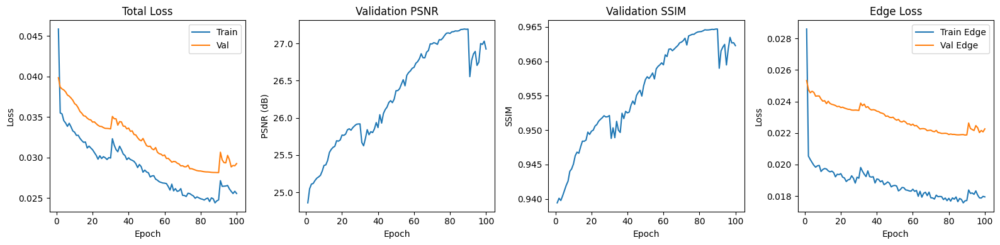

In [ ]:
epochs_range = range(1, len(history["train_total_loss"]) + 1)

plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.plot(epochs_range, history["train_total_loss"], label="Train")
plt.plot(epochs_range, history["val_total_loss"],   label="Val")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title("Total Loss"); plt.legend()

plt.subplot(1, 4, 2)
plt.plot(epochs_range, history["val_psnr"])
plt.xlabel("Epoch"); plt.ylabel("PSNR (dB)"); plt.title("Validation PSNR")

plt.subplot(1, 4, 3)
plt.plot(epochs_range, history["val_ssim"])
plt.xlabel("Epoch"); plt.ylabel("SSIM"); plt.title("Validation SSIM")

plt.subplot(1, 4, 4)
plt.plot(epochs_range, history["train_edge_loss"], label="Train Edge")
plt.plot(epochs_range, history["val_edge_loss"],   label="Val Edge")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title("Edge Loss"); plt.legend()

plt.tight_layout()
plt.show()

## Detailed Training Curves

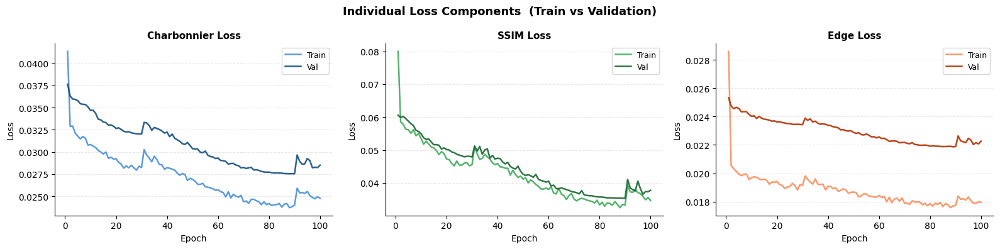

In [ ]:
_ep_r = range(1, len(history["train_total_loss"]) + 1)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle("Individual Loss Components  (Train vs Validation)",
             fontsize=13, fontweight="bold")

_comps = [
    ("char_loss", "Charbonnier Loss", "#4A90D9", "#154f80"),
    ("ssim_loss", "SSIM Loss",        "#41AB5D", "#1a6630"),
    ("edge_loss", "Edge Loss",        "#FC8D59", "#b33000"),
]
for ax, (key, title, c_tr, c_val) in zip(axes, _comps):
    ax.plot(_ep_r, history[f"train_{key}"], color=c_tr,  linewidth=1.8,
            label="Train", alpha=0.9)
    ax.plot(_ep_r, history[f"val_{key}"],   color=c_val, linewidth=1.8,
            label="Val",   alpha=0.9)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.set_xlabel("Epoch", fontsize=10); ax.set_ylabel("Loss", fontsize=10)
    ax.legend(fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)
    ax.yaxis.grid(True, linestyle="--", alpha=0.3); ax.set_axisbelow(True)

plt.tight_layout()
plt.show()


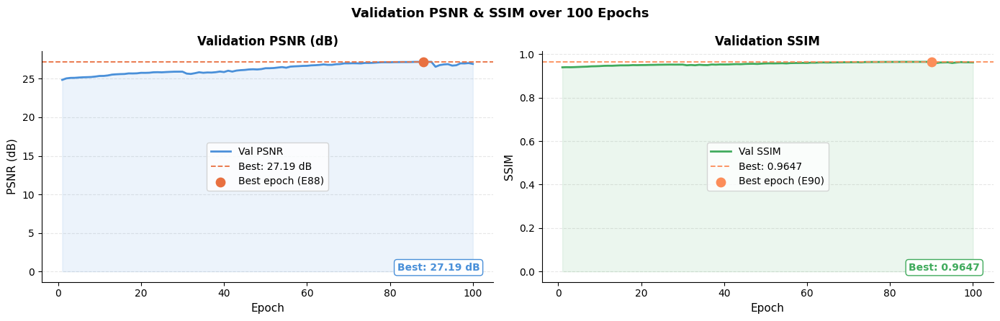

In [ ]:
_ep_r      = range(1, len(history["val_psnr"]) + 1)
_best_psnr = max(history["val_psnr"])
_best_ep_p = history["val_psnr"].index(_best_psnr) + 1
_best_ssim = max(history["val_ssim"])
_best_ep_s = history["val_ssim"].index(_best_ssim) + 1

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4.5))
fig.suptitle("Validation PSNR & SSIM over 100 Epochs",
             fontsize=13, fontweight="bold")

ax1.plot(_ep_r, history["val_psnr"], color="#4A90D9", linewidth=2.0, label="Val PSNR")
ax1.fill_between(_ep_r, history["val_psnr"], alpha=0.10, color="#4A90D9")
ax1.axhline(_best_psnr, color="#E87040", linestyle="--", linewidth=1.3,
            label=f"Best: {_best_psnr:.2f} dB")
ax1.scatter([_best_ep_p], [_best_psnr], color="#E87040", zorder=5, s=80,
            label=f"Best epoch (E{_best_ep_p})")
ax1.set_xlabel("Epoch", fontsize=11); ax1.set_ylabel("PSNR (dB)", fontsize=11)
ax1.set_title("Validation PSNR (dB)", fontsize=12, fontweight="bold")
ax1.legend(fontsize=10)
ax1.text(0.97, 0.05, f"Best: {_best_psnr:.2f} dB",
         transform=ax1.transAxes, ha="right", fontsize=10, color="#4A90D9",
         fontweight="bold", bbox=dict(fc="white", ec="#4A90D9", boxstyle="round,pad=0.3"))
ax1.spines[["top", "right"]].set_visible(False)
ax1.yaxis.grid(True, linestyle="--", alpha=0.3); ax1.set_axisbelow(True)

ax2.plot(_ep_r, history["val_ssim"], color="#41AB5D", linewidth=2.0, label="Val SSIM")
ax2.fill_between(_ep_r, history["val_ssim"], alpha=0.10, color="#41AB5D")
ax2.axhline(_best_ssim, color="#FC8D59", linestyle="--", linewidth=1.3,
            label=f"Best: {_best_ssim:.4f}")
ax2.scatter([_best_ep_s], [_best_ssim], color="#FC8D59", zorder=5, s=80,
            label=f"Best epoch (E{_best_ep_s})")
ax2.set_xlabel("Epoch", fontsize=11); ax2.set_ylabel("SSIM", fontsize=11)
ax2.set_title("Validation SSIM", fontsize=12, fontweight="bold")
ax2.legend(fontsize=10)
ax2.text(0.97, 0.05, f"Best: {_best_ssim:.4f}",
         transform=ax2.transAxes, ha="right", fontsize=10, color="#41AB5D",
         fontweight="bold", bbox=dict(fc="white", ec="#41AB5D", boxstyle="round,pad=0.3"))
ax2.spines[["top", "right"]].set_visible(False)
ax2.yaxis.grid(True, linestyle="--", alpha=0.3); ax2.set_axisbelow(True)

plt.tight_layout()
plt.show()


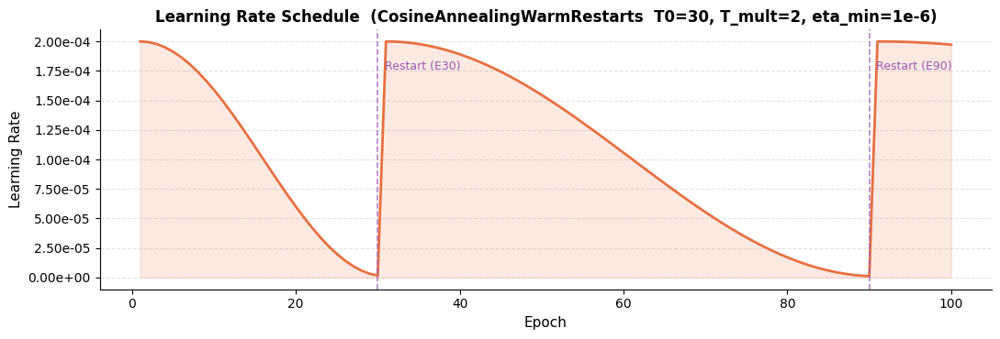

In [ ]:
import matplotlib.ticker as ticker

_d_model = torch.nn.Linear(1, 1)
_d_opt   = torch.optim.AdamW(_d_model.parameters(), lr=2e-4)
_d_sch   = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    _d_opt, T_0=30, T_mult=2, eta_min=1e-6
)
_lrs = []
for _ in range(100):
    _lrs.append(_d_opt.param_groups[0]["lr"])
    _d_sch.step()

fig, ax = plt.subplots(figsize=(11, 3.8))
ax.plot(range(1, 101), _lrs, color="#E87040", linewidth=2.0)
ax.fill_between(range(1, 101), _lrs, alpha=0.15, color="#E87040")
for _re, _rt in [(30, "Restart (E30)"), (90, "Restart (E90)")]:
    ax.axvline(_re, color="#9B59B6", linestyle="--", linewidth=1.2, alpha=0.75)
    ax.text(_re + 0.8, max(_lrs) * 0.88, _rt, fontsize=9, color="#9B59B6")
ax.set_xlabel("Epoch", fontsize=11)
ax.set_ylabel("Learning Rate", fontsize=11)
ax.set_title(
    "Learning Rate Schedule  (CosineAnnealingWarmRestarts  T0=30, T_mult=2, eta_min=1e-6)",
    fontsize=12, fontweight="bold"
)
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.2e"))
ax.spines[["top", "right"]].set_visible(False)
ax.yaxis.grid(True, linestyle="--", alpha=0.35); ax.set_axisbelow(True)
plt.tight_layout()
plt.show()


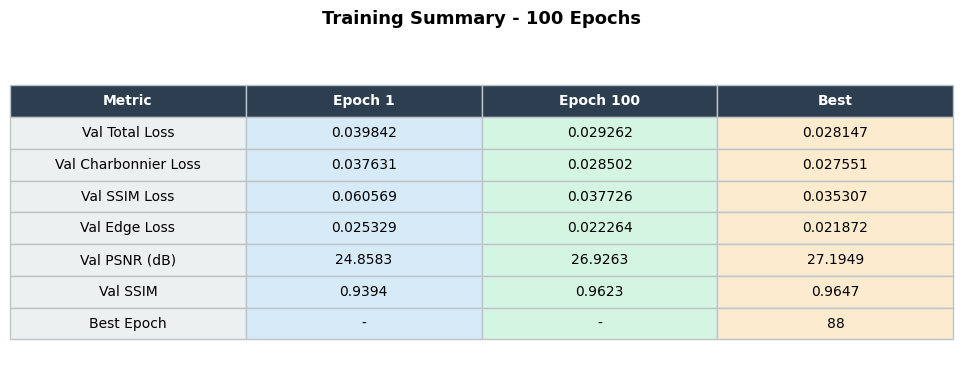

In [ ]:
_best_ep   = history["val_psnr"].index(max(history["val_psnr"])) + 1
_best_psnr = max(history["val_psnr"])
_best_ssim = max(history["val_ssim"])

fig, ax = plt.subplots(figsize=(10, 4))
ax.axis("off")

_tbl = [
    ["Metric",               "Epoch 1",                                    "Epoch 100",                                  "Best"],
    ["Val Total Loss",        f"{history['val_total_loss'][0]:.6f}",        f"{history['val_total_loss'][-1]:.6f}",       f"{min(history['val_total_loss']):.6f}"],
    ["Val Charbonnier Loss",  f"{history['val_char_loss'][0]:.6f}",         f"{history['val_char_loss'][-1]:.6f}",        f"{min(history['val_char_loss']):.6f}"],
    ["Val SSIM Loss",         f"{history['val_ssim_loss'][0]:.6f}",         f"{history['val_ssim_loss'][-1]:.6f}",        f"{min(history['val_ssim_loss']):.6f}"],
    ["Val Edge Loss",         f"{history['val_edge_loss'][0]:.6f}",         f"{history['val_edge_loss'][-1]:.6f}",        f"{min(history['val_edge_loss']):.6f}"],
    ["Val PSNR (dB)",         f"{history['val_psnr'][0]:.4f}",              f"{history['val_psnr'][-1]:.4f}",             f"{_best_psnr:.4f}"],
    ["Val SSIM",              f"{history['val_ssim'][0]:.4f}",              f"{history['val_ssim'][-1]:.4f}",             f"{_best_ssim:.4f}"],
    ["Best Epoch",            "-",                                          "-",                                           str(_best_ep)],
]

_cc = [["#ECF0F1", "#D6EAF8", "#D5F5E3", "#FDEBD0"]] * (len(_tbl) - 1)
_t  = ax.table(cellText=_tbl[1:], colLabels=_tbl[0], loc="center",
               cellLoc="center", cellColours=_cc)
_t.auto_set_font_size(False); _t.set_fontsize(10); _t.scale(1.35, 1.75)
for (_r, _c), _cell in _t.get_celld().items():
    if _r == 0:
        _cell.set_facecolor("#2C3E50")
        _cell.set_text_props(color="white", fontweight="bold")
    _cell.set_edgecolor("#BDC3C7")

ax.set_title("Training Summary - 100 Epochs",
             fontsize=13, fontweight="bold", pad=15)
plt.tight_layout()
plt.show()


## Load best model and evaluate

In [ ]:
checkpoint = torch.load(best_model_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("Loaded best model from:", best_model_path)
print("Best epoch            :", checkpoint["epoch"])
print(f"Best PSNR             : {checkpoint['best_psnr']:.4f} dB")

Loaded best model from: /content/drive/MyDrive/PixelClear/Motion-Blur-Removing-PixelClear/v7/unet_residual_v7_best.pth
Best epoch            : 88
Best PSNR             : 27.1949 dB


/tmp/ipykernel_596/2579010657.py:10: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


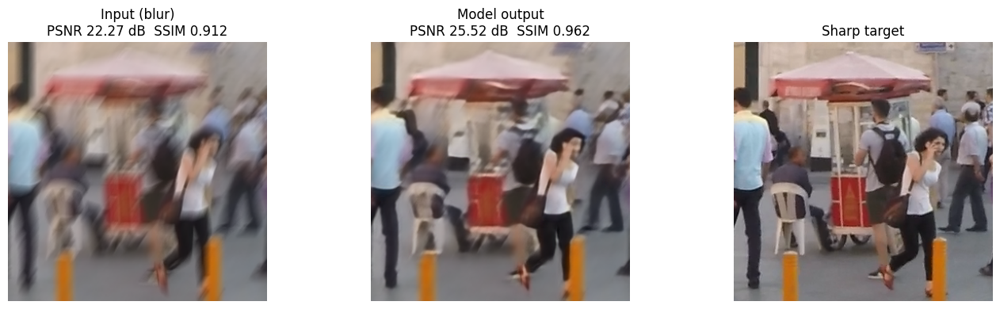

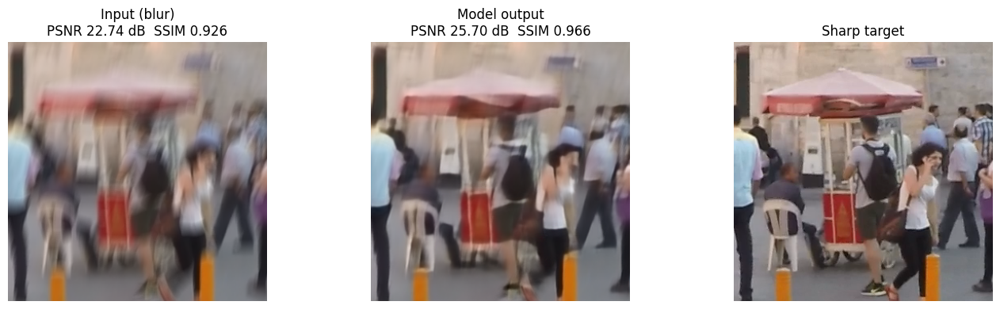

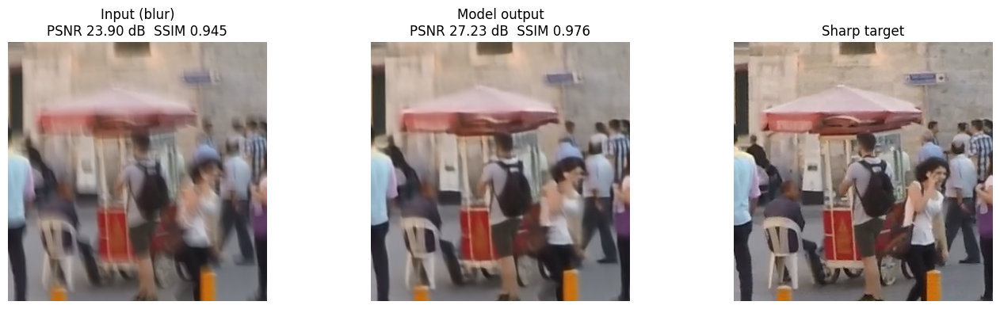

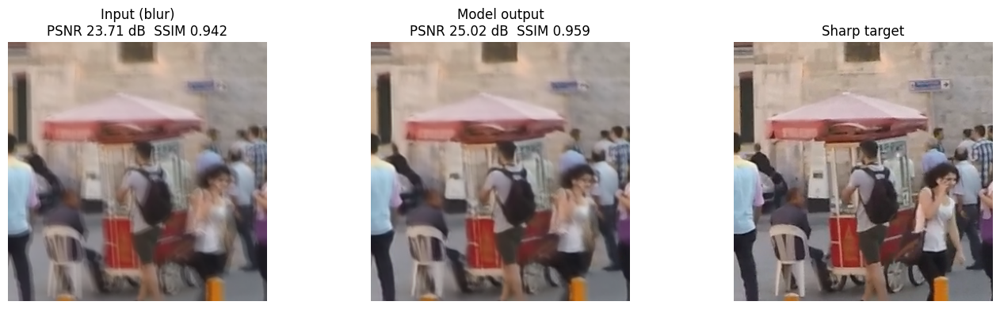

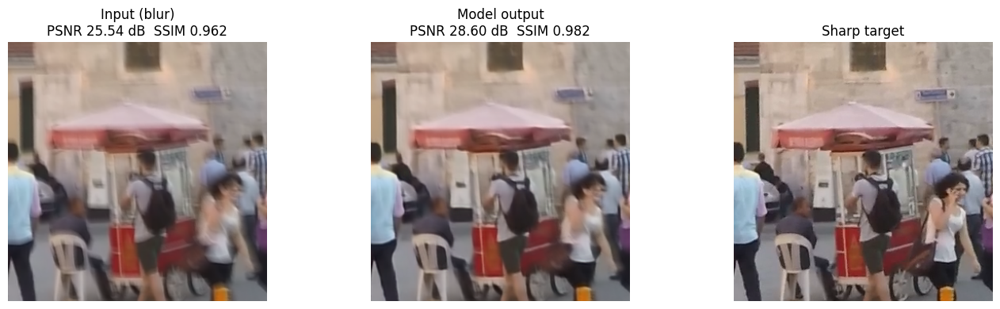

In [ ]:
@torch.no_grad()
def show_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0

    for inputs, targets in loader:
        inputs  = inputs.to(device)
        targets = targets.to(device)

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            outputs = model(inputs)

        for i in range(inputs.size(0)):
            input_psnr  = compute_psnr(inputs[i:i+1].float(),  targets[i:i+1].float())
            output_psnr = compute_psnr(outputs[i:i+1].float(), targets[i:i+1].float())
            input_ssim  = compute_ssim_simple(inputs[i:i+1].float(),  targets[i:i+1].float())
            output_ssim = compute_ssim_simple(outputs[i:i+1].float(), targets[i:i+1].float())

            fig, axes = plt.subplots(1, 3, figsize=(14, 4))

            axes[0].imshow(tensor_to_image(inputs[i].cpu()))
            axes[0].set_title(f"Input (blur)\nPSNR {input_psnr:.2f} dB  SSIM {input_ssim:.3f}")
            axes[0].axis("off")

            axes[1].imshow(tensor_to_image(outputs[i].cpu().float()))
            axes[1].set_title(f"Model output\nPSNR {output_psnr:.2f} dB  SSIM {output_ssim:.3f}")
            axes[1].axis("off")

            axes[2].imshow(tensor_to_image(targets[i].cpu()))
            axes[2].set_title("Sharp target")
            axes[2].axis("off")

            plt.tight_layout()
            plt.show()

            shown += 1
            if shown >= num_samples:
                return


show_predictions(model, test_loader, device, num_samples=5)

In [ ]:
@torch.no_grad()
def evaluate_model(model, loader, device):
    model.eval()

    total_input_psnr  = 0.0
    total_output_psnr = 0.0
    total_input_ssim  = 0.0
    total_output_ssim = 0.0
    count = 0

    for inputs, targets in tqdm(loader, desc="Evaluating"):
        inputs  = inputs.to(device)
        targets = targets.to(device)

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            outputs = model(inputs)

        for i in range(inputs.size(0)):
            inp_f = inputs[i:i+1].float()
            out_f = outputs[i:i+1].float()
            tgt_f = targets[i:i+1].float()

            total_input_psnr  += compute_psnr(inp_f, tgt_f)
            total_output_psnr += compute_psnr(out_f, tgt_f)
            total_input_ssim  += compute_ssim_simple(inp_f, tgt_f)
            total_output_ssim += compute_ssim_simple(out_f, tgt_f)
            count += 1

    print(f"Avg PSNR  Input  : {total_input_psnr  / count:.4f} dB")
    print(f"Avg PSNR  Output : {total_output_psnr / count:.4f} dB")
    print(f"Avg Delta PSNR   : {(total_output_psnr - total_input_psnr) / count:+.4f} dB")
    print(f"Avg SSIM  Input  : {total_input_ssim  / count:.4f}")
    print(f"Avg SSIM  Output : {total_output_ssim / count:.4f}")
    print(f"Avg Delta SSIM   : {(total_output_ssim - total_input_ssim) / count:+.4f}")


evaluate_model(model, test_loader, device)

Evaluating:   0%|          | 0/139 [00:00<?, ?it/s]

/tmp/ipykernel_596/945353970.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


Avg PSNR  Input  : 25.5728 dB
Avg PSNR  Output : 27.6567 dB
Avg Delta PSNR   : +2.0839 dB
Avg SSIM  Input  : 0.9374
Avg SSIM  Output : 0.9646
Avg Delta SSIM   : +0.0272


## Single-image inference

In [ ]:
from google.colab import files
import torchvision.transforms as transforms
import cv2

In [ ]:
def variance_of_laplacian(pil_img):
    img  = np.array(pil_img.convert("RGB"))
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()


def compute_deblur_percentage(input_pil, output_pil):
    input_score  = variance_of_laplacian(input_pil)
    output_score = variance_of_laplacian(output_pil)
    improvement_pct = 0.0 if input_score < 1e-8 else \
                      ((output_score - input_score) / input_score) * 100.0
    return input_score, output_score, improvement_pct

In [ ]:
@torch.no_grad()
def run_single_image_inference(
    model, image_path, device,
    resize_to=(512, 512),
    save_dir="/content/drive/MyDrive/PixelClear/Motion-Blur-Removing-PixelClear/inference_outputs"
):
    model.eval()
    os.makedirs(save_dir, exist_ok=True)

    original_img = Image.open(image_path).convert("RGB")
    resized_img  = original_img.resize(resize_to, Image.BICUBIC)

    input_tensor = transforms.ToTensor()(resized_img).unsqueeze(0).to(device)

    with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
        output_tensor = model(input_tensor).clamp(0, 1).float()

    output_img = transforms.ToPILImage()(output_tensor.squeeze(0).cpu())

    input_score, output_score, improvement_pct = compute_deblur_percentage(resized_img, output_img)

    base_name   = os.path.splitext(os.path.basename(image_path))[0]
    output_path = os.path.join(save_dir, f"{base_name}_deblurred_v7.png")
    output_img.save(output_path)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(resized_img);  axes[0].set_title("Input image");    axes[0].axis("off")
    axes[1].imshow(output_img);   axes[1].set_title("Deblurred output"); axes[1].axis("off")
    plt.tight_layout()
    plt.show()

    print("Input path              :", image_path)
    print("Output saved to         :", output_path)
    print(f"Input sharpness score   : {input_score:.4f}")
    print(f"Output sharpness score  : {output_score:.4f}")
    print(f"Estimated improvement   : {improvement_pct:.2f}%")

    return output_path, input_score, output_score, improvement_pct

Saving 000001.png to 000001.png
Uploaded file: 000001.png


/tmp/ipykernel_596/799678913.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


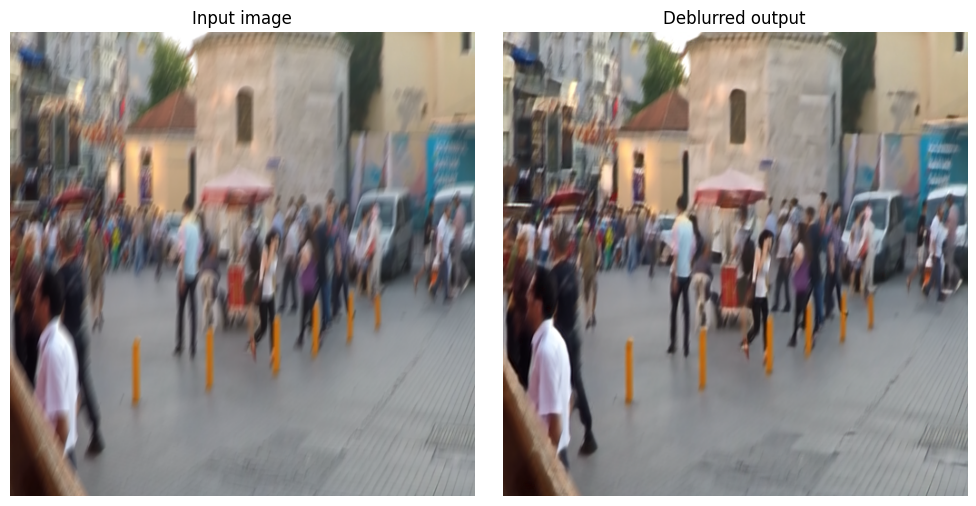

Input path              : 000001.png
Output saved to         : /content/drive/MyDrive/PixelClear/Motion-Blur-Removing-PixelClear/inference_outputs/000001_deblurred_v7.png
Input sharpness score   : 67.8379
Output sharpness score  : 114.9723
Estimated improvement   : 69.48%


In [ ]:
uploaded = files.upload()

uploaded_image_path = list(uploaded.keys())[0]
print("Uploaded file:", uploaded_image_path)

output_path = run_single_image_inference(
    model=model,
    image_path=uploaded_image_path,
    device=device,
    resize_to=(512, 512)
)